# Human Connectome Project (HCP) Dataset loader

The HCP dataset comprises resting-state and task-based fMRI from a large sample of human subjects. The NMA-curated dataset includes time series data that has been preprocessed and spatially-downsampled by aggregating within 360 regions of interest.

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import gamma

In [2]:
# Necessary for visualization
!pip install nilearn --quiet
from nilearn import plotting, datasets

     |████████████████████████████████| 4.9 MB 4.3 MB/s 


/usr/local/lib/python3.7/dist-packages/nilearn/datasets/__init__.py:89: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  "Numpy arrays.", FutureWarning)


In [3]:
#@title Figure settings
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use("https://raw.githubusercontent.com/NeuromatchAcademy/course-content/master/nma.mplstyle")

# Basic parameters

In [4]:
# The download cells will store the data in nested directories starting here:
HCP_DIR = "./hcp"
if not os.path.isdir(HCP_DIR):
  os.mkdir(HCP_DIR)

# The data shared for NMA projects is a subset of the full HCP dataset
N_SUBJECTS = 339

# The data have already been aggregated into ROIs from the Glasesr parcellation
N_PARCELS = 360

# The acquisition parameters for all tasks were identical
TR = 0.72  # Time resolution, in sec

# The parcels are matched across hemispheres with the same order
HEMIS = ["Right", "Left"]

# Each experiment was repeated multiple times in each subject
N_RUNS_REST = 4
N_RUNS_TASK = 2

# Time series data are organized by experiment, with each experiment
# having an LR and RL (phase-encode direction) acquistion
BOLD_NAMES = [
  "rfMRI_REST1_LR", "rfMRI_REST1_RL",
  "rfMRI_REST2_LR", "rfMRI_REST2_RL",
  "tfMRI_MOTOR_RL", "tfMRI_MOTOR_LR",
  "tfMRI_WM_RL", "tfMRI_WM_LR",
  "tfMRI_EMOTION_RL", "tfMRI_EMOTION_LR",
  "tfMRI_GAMBLING_RL", "tfMRI_GAMBLING_LR",
  "tfMRI_LANGUAGE_RL", "tfMRI_LANGUAGE_LR",
  "tfMRI_RELATIONAL_RL", "tfMRI_RELATIONAL_LR",
  "tfMRI_SOCIAL_RL", "tfMRI_SOCIAL_LR"
]

# You may want to limit the subjects used during code development.
# This will use all subjects:
subjects = range(N_SUBJECTS)

# Downloading data

The rest and task data are shared in different files, but they will unpack into the same directory structure.

Each file is fairly large and will take some time to download. If you are focusing only on rest or task analyses, you may not want to download only that dataset.

We also separately provide some potentially useful behavioral covariate information.

In [5]:
fname = "hcp_rest.tgz"
if not os.path.exists(fname):
  !wget -qO $fname https://osf.io/bqp7m/download/
  !tar -xzf $fname -C $HCP_DIR --strip-components=1

In [6]:
fname = "hcp_task.tgz"
if not os.path.exists(fname):
  !wget -qO $fname https://osf.io/s4h8j/download/
  !tar -xzf $fname -C $HCP_DIR --strip-components=1

In [7]:
fname = "hcp_covariates.tgz"
if not os.path.exists(fname):
  !wget -qO $fname https://osf.io/x5p4g/download/
  !tar -xzf $fname -C $HCP_DIR --strip-components=1

In [8]:
fname = f"{HCP_DIR}/atlas.npz"
if not os.path.exists(fname):
  !wget -qO $fname https://osf.io/j5kuc/download

## Loading region information

Downloading either dataset will create the `regions.npy` file, which contains the region name and network assignment for each parcel.

Detailed information about the name used for each region is provided [in the Supplement](https://static-content.springer.com/esm/art%3A10.1038%2Fnature18933/MediaObjects/41586_2016_BFnature18933_MOESM330_ESM.pdf) to [Glasser et al. 2016](https://www.nature.com/articles/nature18933).

Information about the network parcellation is provided in [Ji et al, 2019](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6289683/).

In [9]:
regions = np.load(f"{HCP_DIR}/regions.npy").T
region_info = dict(
                                name=regions[0].tolist(),
                                network=regions[1],
                                myelin=regions[2].astype(np.float),
                            )

regions_df = pd.DataFrame(regions)
regions_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359
0,R_V1,R_MST,R_V6,R_V2,R_V3,R_V4,R_V8,R_4,R_3b,R_FEF,R_PEF,R_55b,R_V3A,R_RSC,R_POS2,R_V7,R_IPS1,R_FFC,R_V3B,R_LO1,R_LO2,R_PIT,R_MT,R_A1,R_PSL,R_SFL,R_PCV,R_STV,R_7Pm,R_7m,R_POS1,R_23d,R_v23ab,R_d23ab,R_31pv,R_5m,R_5mv,R_23c,R_5L,R_24dd,...,L_TPOJ3,L_DVT,L_PGp,L_IP2,L_IP1,L_IP0,L_PFop,L_PF,L_PFm,L_PGi,L_PGs,L_V6A,L_VMV1,L_VMV3,L_PHA2,L_V4t,L_FST,L_V3CD,L_LO3,L_VMV2,L_31pd,L_31a,L_VVC,L_25,L_s32,L_pOFC,L_PoI1,L_Ig,L_FOP5,L_p10p,L_p47r,L_TGv,L_MBelt,L_LBelt,L_A4,L_STSva,L_TE1m,L_PI,L_a32pr,L_p24
1,Visual1,Visual2,Visual2,Visual2,Visual2,Visual2,Visual2,Somatomotor,Somatomotor,Cingulo-Oper,Language,Default,Visual2,Frontopariet,Frontopariet,Visual2,Visual2,Visual2,Visual2,Visual2,Visual2,Visual2,Visual2,Auditory,Default,Default,Dorsal-atten,Default,Frontopariet,Posterior-Mu,Posterior-Mu,Posterior-Mu,Posterior-Mu,Posterior-Mu,Posterior-Mu,Somatomotor,Cingulo-Oper,Cingulo-Oper,Somatomotor,Somatomotor,...,Dorsal-atten,Visual1,Language,Frontopariet,Frontopariet,Language,Cingulo-Oper,Cingulo-Oper,Frontopariet,Posterior-Mu,Posterior-Mu,Visual2,Visual2,Visual2,Posterior-Mu,Visual2,Visual2,Visual2,Visual2,Visual2,Posterior-Mu,Frontopariet,Visual2,Posterior-Mu,Posterior-Mu,Orbito-Affec,Cingulo-Oper,Somatomotor,Cingulo-Oper,Frontopariet,Frontopariet,Default,Auditory,Auditory,Auditory,Posterior-Mu,Frontopariet,Cingulo-Oper,Cingulo-Oper,Cingulo-Oper
2,2.209,2.05561,2.1498,2.15347,2.07251,2.0378,2.04079,2.16893,2.10655,1.87217,1.83377,1.80661,2.10431,2.31169,2.00603,2.05905,1.97727,1.92808,2.03962,1.95394,1.93288,1.9352,2.03289,2.29365,1.77188,1.68062,1.85286,1.83748,1.8366,1.91503,2.04855,1.85992,2.02115,1.94532,1.9379,2.01784,1.85632,1.80211,1.83117,1.96209,...,1.77318,1.8639,1.70465,1.82142,1.80395,1.79594,1.80771,1.73574,1.71462,1.72361,1.69491,1.89908,1.96151,1.89103,1.72891,1.82218,1.75336,1.81001,1.79295,1.8771,1.82105,1.77241,1.87979,1.7062,1.66429,1.97668,1.80404,1.92517,1.89881,1.81126,1.83928,1.60184,2.16331,2.20776,1.94505,1.7608,1.74175,1.74335,1.73082,1.65968


In [10]:
#AV 
#regions_df.iloc[0,:].nunique()
regions_df.nunique(axis=1)
#list(regions_df.iloc[1,:].values_counts())
#list(map(set,regions_df.values)) # works
#pd.DataFrame()
print(list(map(set,regions_df.iloc[:,0:-1].values))[1])
print(len(list(map(set,regions_df.iloc[:,0:-1].values))[1]))
print(len(list(map(set,regions_df.iloc[:,0:-1].values))[0]))
print(len(list(map(set,regions_df.iloc[:,0:-1].values))[2]))
#regions_df.values[2]

regions_df['num_uniq'] = regions_df.stack().groupby(level=0).nunique() # counts no. of unique items in a row & puts counts in a new column
#regions_df[:,-1]
regions_df.iloc[:,0:-1] # prints df without last column


{'Visual1', 'Cingulo-Oper', 'Frontopariet', 'Somatomotor', 'Language', 'Ventral-Mult', 'Dorsal-atten', 'Visual2', 'Posterior-Mu', 'Orbito-Affec', 'Auditory', 'Default'}
12
359
359


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359
0,R_V1,R_MST,R_V6,R_V2,R_V3,R_V4,R_V8,R_4,R_3b,R_FEF,R_PEF,R_55b,R_V3A,R_RSC,R_POS2,R_V7,R_IPS1,R_FFC,R_V3B,R_LO1,R_LO2,R_PIT,R_MT,R_A1,R_PSL,R_SFL,R_PCV,R_STV,R_7Pm,R_7m,R_POS1,R_23d,R_v23ab,R_d23ab,R_31pv,R_5m,R_5mv,R_23c,R_5L,R_24dd,...,L_TPOJ3,L_DVT,L_PGp,L_IP2,L_IP1,L_IP0,L_PFop,L_PF,L_PFm,L_PGi,L_PGs,L_V6A,L_VMV1,L_VMV3,L_PHA2,L_V4t,L_FST,L_V3CD,L_LO3,L_VMV2,L_31pd,L_31a,L_VVC,L_25,L_s32,L_pOFC,L_PoI1,L_Ig,L_FOP5,L_p10p,L_p47r,L_TGv,L_MBelt,L_LBelt,L_A4,L_STSva,L_TE1m,L_PI,L_a32pr,L_p24
1,Visual1,Visual2,Visual2,Visual2,Visual2,Visual2,Visual2,Somatomotor,Somatomotor,Cingulo-Oper,Language,Default,Visual2,Frontopariet,Frontopariet,Visual2,Visual2,Visual2,Visual2,Visual2,Visual2,Visual2,Visual2,Auditory,Default,Default,Dorsal-atten,Default,Frontopariet,Posterior-Mu,Posterior-Mu,Posterior-Mu,Posterior-Mu,Posterior-Mu,Posterior-Mu,Somatomotor,Cingulo-Oper,Cingulo-Oper,Somatomotor,Somatomotor,...,Dorsal-atten,Visual1,Language,Frontopariet,Frontopariet,Language,Cingulo-Oper,Cingulo-Oper,Frontopariet,Posterior-Mu,Posterior-Mu,Visual2,Visual2,Visual2,Posterior-Mu,Visual2,Visual2,Visual2,Visual2,Visual2,Posterior-Mu,Frontopariet,Visual2,Posterior-Mu,Posterior-Mu,Orbito-Affec,Cingulo-Oper,Somatomotor,Cingulo-Oper,Frontopariet,Frontopariet,Default,Auditory,Auditory,Auditory,Posterior-Mu,Frontopariet,Cingulo-Oper,Cingulo-Oper,Cingulo-Oper
2,2.209,2.05561,2.1498,2.15347,2.07251,2.0378,2.04079,2.16893,2.10655,1.87217,1.83377,1.80661,2.10431,2.31169,2.00603,2.05905,1.97727,1.92808,2.03962,1.95394,1.93288,1.9352,2.03289,2.29365,1.77188,1.68062,1.85286,1.83748,1.8366,1.91503,2.04855,1.85992,2.02115,1.94532,1.9379,2.01784,1.85632,1.80211,1.83117,1.96209,...,1.77318,1.8639,1.70465,1.82142,1.80395,1.79594,1.80771,1.73574,1.71462,1.72361,1.69491,1.89908,1.96151,1.89103,1.72891,1.82218,1.75336,1.81001,1.79295,1.8771,1.82105,1.77241,1.87979,1.7062,1.66429,1.97668,1.80404,1.92517,1.89881,1.81126,1.83928,1.60184,2.16331,2.20776,1.94505,1.7608,1.74175,1.74335,1.73082,1.65968


We also provide the [parcellation on the fsaverage5 surface](https://figshare.com/articles/HCP-MMP1_0_projected_on_fsaverage/3498446) and approximate MNI coordinates of each region, which can be useful for visualization:

In [11]:
with np.load(f"{HCP_DIR}/atlas.npz") as dobj:
  atlas = dict(**dobj)



# print(pd.DataFrame( atlas['coords']) )

# print(len(atlas['labels_L']))
# print(len(atlas['coords'])) # coords for each region
# print(len(atlas['labels_R']))
pd.DataFrame( atlas['coords'] )

,0,1,2
0,13.887051,-79.369891,2.955396
1,43.310779,-65.464352,3.658883
2,17.078186,-76.273576,28.453226
3,13.892814,-79.528842,3.723094
4,19.740963,-85.705105,6.249615
...,...,...,...
355,-51.912858,-14.253047,-16.839735
356,-60.898980,-29.035936,-17.068524
357,-43.663334,-6.439811,-15.546536
358,-10.614765,29.207796,26.915864


# Helper functions


## Data loading

In [12]:
def get_image_ids(name):
  """Get the 1-based image indices for runs in a given experiment.

    Args:
      name (str) : Name of experiment ("rest" or name of task) to load
    Returns:
      run_ids (list of int) : Numeric ID for experiment image files

  """
  run_ids = [
    i for i, code in enumerate(BOLD_NAMES, 1) if name.upper() in code
  ]
  if not run_ids:
    raise ValueError(f"Found no data for '{name}''")
  return run_ids

def load_timeseries(subject, name, runs=None, concat=True, remove_mean=True):
  """Load timeseries data for a single subject.
  
  Args:
    subject (int): 0-based subject ID to load
    name (str) : Name of experiment ("rest" or name of task) to load
    run (None or int or list of ints): 0-based run(s) of the task to load,
      or None to load all runs.
    concat (bool) : If True, concatenate multiple runs in time
    remove_mean (bool) : If True, subtract the parcel-wise mean

  Returns
    ts (n_parcel x n_tp array): Array of BOLD data values

  """
  # Get the list relative 0-based index of runs to use
  if runs is None:
    runs = range(N_RUNS_REST) if name == "rest" else range(N_RUNS_TASK)
  elif isinstance(runs, int):
    runs = [runs]

  # Get the first (1-based) run id for this experiment 
  offset = get_image_ids(name)[0]

  # Load each run's data
  bold_data = [
      load_single_timeseries(subject, offset + run, remove_mean) for run in runs ]

  # Optionally concatenate in time
  if concat:
    bold_data = np.concatenate(bold_data, axis=-1)

  return bold_data


def load_single_timeseries(subject, bold_run, remove_mean=True):
  """Load timeseries data for a single subject and single run.
  
  Args:
    subject (int): 0-based subject ID to load
    bold_run (int): 1-based run index, across all tasks
    remove_mean (bool): If True, subtract the parcel-wise mean

  Returns
    ts (n_parcel x n_timepoint array): Array of BOLD data values

  """
  bold_path = f"{HCP_DIR}/subjects/{subject}/timeseries"
  bold_file = f"bold{bold_run}_Atlas_MSMAll_Glasser360Cortical.npy"
  ts = np.load(f"{bold_path}/{bold_file}")
  if remove_mean:
    ts -= ts.mean(axis=1, keepdims=True)
  return ts

def load_evs(subject, name, condition):
  """Load EV (explanatory variable) data for one task condition.

  Args:
    subject (int): 0-based subject ID to load
    name (str) : Name of task
    condition (str) : Name of condition

  Returns
    evs (list of dicts): A dictionary with the onset, duration, and amplitude
      of the condition for each run.

  """
  evs = []
  for id in get_image_ids(name):
    task_key = BOLD_NAMES[id - 1]
    ev_file = f"{HCP_DIR}/subjects/{subject}/EVs/{task_key}/{condition}.txt"
    ev_array = np.loadtxt(ev_file, ndmin=2, unpack=True)
    ev = dict(zip(["onset", "duration", "amplitude"], ev_array))
    evs.append(ev)
  return evs

## Task-based analysis

In [13]:
def condition_frames(run_evs, skip=0):
  """Identify timepoints corresponding to a given condition in each run.

  Args:
    run_evs (list of dicts) : Onset and duration of the event, per run
    skip (int) : Ignore this many frames at the start of each trial, to account
      for hemodynamic lag

  Returns:
    frames_list (list of 1D arrays): Flat arrays of frame indices, per run

  """
  frames_list = []
  for ev in run_evs:

    # Determine when trial starts, rounded down
    start = np.floor(ev["onset"] / TR).astype(int)

    # Use trial duration to determine how many frames to include for trial
    duration = np.ceil(ev["duration"] / TR).astype(int)

    # Take the range of frames that correspond to this specific trial
    frames = [s + np.arange(skip, d) for s, d in zip(start, duration)]

    frames_list.append(np.concatenate(frames))

  return frames_list


def selective_average(timeseries_data, ev, skip=0):
  """Take the temporal mean across frames for a given condition.

  Args:
    timeseries_data (array or list of arrays): n_parcel x n_tp arrays
    ev (dict or list of dicts): Condition timing information
    skip (int) : Ignore this many frames at the start of each trial, to account
      for hemodynamic lag

  Returns:
    avg_data (1D array): Data averagted across selected image frames based
    on condition timing

  """
  # Ensure that we have lists of the same length
  if not isinstance(timeseries_data, list):
    timeseries_data = [timeseries_data]
  if not isinstance(ev, list):
    ev = [ev]
  if len(timeseries_data) != len(ev):
    raise ValueError("Length of `timeseries_data` and `ev` must match.")

  # Identify the indices of relevant frames
  frames = condition_frames(ev, skip)

  # Select the frames from each image
  selected_data = []
  for run_data, run_frames in zip(timeseries_data, frames):
    run_frames = run_frames[run_frames < run_data.shape[1]]
    selected_data.append(run_data[:, run_frames])

  # Take the average in each parcel
  avg_data = np.concatenate(selected_data, axis=-1).mean(axis=-1)

  return avg_data

# Resting-state analyses

Load a single run of resting-state data:

In [14]:
condition_frames( load_evs( 0 , 'GAMBLING' , 'loss') ) 

[array([ 72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,
         85,  86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,
         98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110,
        133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145,
        146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158,
        159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171]),
 array([ 11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,
         24,  25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,
         37,  38,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,
        133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145,
        146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158,
        159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171])]

In [15]:
condition_frames(load_evs( 0 , 'GAMBLING' , 'loss_event')) 

[array([ 21,  22,  23,  24,  25,  77,  78,  79,  80,  81,  82,  83,  84,
         85,  86,  87,  88,  89,  90,  91,  97,  98,  99, 100, 101, 102,
        103, 104, 105, 106, 107, 108, 109, 110, 111, 133, 134, 135, 136,
        137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 153, 154,
        155, 156, 157, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172,
        203, 204, 205, 206, 207, 214, 215, 216, 217, 218]),
 array([ 11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  26,  27,  28,
         29,  30,  36,  37,  38,  39,  40,  41,  42,  43,  44,  45,  46,
         47,  48,  49,  50, 133, 134, 135, 136, 137, 138, 139, 140, 141,
        142, 148, 149, 150, 151, 152, 158, 159, 160, 161, 162, 163, 164,
        165, 166, 167, 168, 169, 170, 171, 172, 204, 205, 206, 207, 208,
        214, 215, 216, 217, 218])]

In [16]:
condition_frames(load_evs( 0 , 'GAMBLING' , 'win_event')) 

[array([ 11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  26,  27,  28,
         29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  46,
         47,  48,  49,  50,  72,  73,  74,  75,  76, 193, 194, 195, 196,
        197, 198, 199, 200, 201, 202, 209, 210, 211, 212, 213, 219, 220,
        221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233]),
 array([ 21,  22,  23,  24,  25,  31,  32,  33,  34,  35,  72,  73,  74,
         75,  76,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,
         93,  94,  95,  96,  97,  98,  99, 100, 101, 107, 108, 109, 110,
        111, 143, 144, 145, 146, 147, 153, 154, 155, 156, 157, 193, 194,
        195, 196, 197, 199, 200, 201, 202, 203, 209, 210, 211, 212, 213,
        219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231,
        232, 233])]

In [17]:
condition_frames(load_evs( 0 , 'GAMBLING' , 'win')) 

[array([ 11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,
         24,  25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,
         37,  38,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,
        193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205,
        206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218,
        219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231]),
 array([ 72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,
         85,  86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,
         98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110,
        193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205,
        206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218,
        219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231])]

In [18]:
help(load_timeseries)

Help on function load_timeseries in module __main__:

load_timeseries(subject, name, runs=None, concat=True, remove_mean=True)
    Load timeseries data for a single subject.
    
    Args:
      subject (int): 0-based subject ID to load
      name (str) : Name of experiment ("rest" or name of task) to load
      run (None or int or list of ints): 0-based run(s) of the task to load,
        or None to load all runs.
      concat (bool) : If True, concatenate multiple runs in time
      remove_mean (bool) : If True, subtract the parcel-wise mean
    
    Returns
      ts (n_parcel x n_tp array): Array of BOLD data values



In [19]:
# resting state fMRI

timeseries = load_timeseries(subject=0, name="GAMBLING", runs=0)
print(timeseries.shape)  # n_parcel x n_timepoint

(360, 253)


In [20]:
timeseries_df= pd.DataFrame(timeseries)
timeseries_df # n_parcel x n_timepoint

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252
0,11.539921,13.939921,-34.260079,-77.660079,-192.660079,-249.660079,-287.860079,-289.760079,-256.760079,-248.460079,-229.560079,-250.360079,-214.260079,-212.760079,-192.660079,-174.160079,-111.960079,-63.260079,-23.460079,34.439921,16.739921,-9.460079,40.939921,25.939921,36.139921,23.839921,-21.760079,-16.760079,24.639921,60.839921,46.939921,46.039921,13.239921,33.439921,28.139921,100.239921,65.639921,95.039921,92.739921,119.839921,...,-142.460079,-124.960079,-97.160079,-55.760079,-34.560079,-48.960079,-82.160079,-42.460079,-27.760079,-31.760079,24.739921,-3.360079,-17.460079,5.139921,-0.960079,-42.260079,-12.860079,-66.760079,-2.260079,-1.360079,-16.460079,0.439921,-2.860079,6.139921,58.439921,54.539921,57.239921,52.539921,53.939921,50.439921,52.139921,24.039921,-10.060079,9.439921,34.939921,33.039921,74.539921,62.939921,25.739921,5.639921
1,-6.092490,29.107510,-37.792490,-98.792490,-34.192490,-80.992490,-12.992490,-2.592490,-90.992490,36.407510,15.407510,19.007510,-44.992490,-17.992490,-0.992490,7.507510,70.307510,57.307510,56.707510,59.207510,39.907510,18.607510,45.807510,125.507510,87.507510,41.807510,28.007510,-46.492490,44.007510,64.507510,53.807510,18.807510,56.207510,59.407510,42.907510,29.207510,-3.092490,5.407510,36.707510,35.407510,...,-31.992490,-107.892490,-16.892490,-41.892490,34.007510,23.007510,-0.692490,-21.492490,-7.692490,20.107510,31.207510,-23.792490,63.407510,32.507510,33.507510,101.707510,54.707510,6.307510,-42.792490,24.707510,29.007510,20.207510,2.907510,42.307510,90.907510,23.007510,52.607510,46.907510,61.907510,99.307510,-49.092490,26.607510,56.007510,72.207510,45.907510,17.207510,-58.592490,28.307510,-12.092490,7.107510
2,139.484190,109.484190,76.184190,24.284190,-29.815810,-53.115810,-10.815810,-5.515810,-12.115810,-53.315810,-29.815810,-52.015810,-100.815810,-78.915810,-73.215810,-116.815810,-61.515810,-47.015810,35.884190,-14.615810,-1.115810,-66.115810,-39.315810,-25.015810,5.284190,-67.015810,-39.615810,-16.715810,-0.615810,17.384190,24.984190,-43.115810,-66.315810,-72.615810,-73.815810,-1.015810,12.484190,-4.515810,44.884190,42.184190,...,-100.615810,-79.915810,-29.215810,14.784190,-14.615810,-60.815810,-137.515810,-88.915810,-71.615810,-64.515810,-58.515810,-69.515810,-39.615810,-27.415810,12.984190,-70.115810,-77.715810,-12.915810,26.584190,-8.915810,-10.515810,49.284190,51.784190,88.984190,32.684190,26.784190,65.684190,64.484190,94.584190,77.884190,4.684190,59.884190,24.284190,78.684190,75.284190,93.184190,125.484190,60.984190,17.784190,-1.715810
3,15.949802,0.049802,-40.450198,-89.350198,-146.050198,-192.350198,-213.150198,-184.550198,-180.550198,-183.950198,-208.750198,-200.250198,-190.850198,-127.950198,-122.250198,-109.350198,-82.850198,-32.050198,-9.450198,32.349802,30.349802,26.549802,44.949802,27.849802,40.449802,6.149802,10.949802,11.449802,29.449802,41.749802,57.249802,37.149802,25.449802,11.549802,56.049802,65.649802,34.349802,20.149802,58.449802,56.049802,...,-118.350198,-101.250198,-89.850198,-49.450198,-38.350198,-44.150198,-39.550198,-65.250198,-17.850198,-33.150198,19.749802,-21.950198,-2.650198,-15.750198,7.349802,-17.650198,-1.850198,-30.650198,-15.750198,16.549802,-2.050198,25.749802,2.649802,45.049802,47.749802,59.149802,38.749802,71.649802,76.849802,62.249802,64.549802,15.249802,33.949802,18.149802,7.449802,8.849802,39.749802,18.049802,17.849802,-8.650198
4,38.964032,41.064032,8.564032,-19.035968,-78.535968,-123.435968,-124.135968,-107.935968,-114.935968,-101.235968,-132.635968,-135.635968,-115.735968,-101.535968,-69.435968,-54.835968,-27.235968,9.364032,21.464032,55.064032,69.664032,29.564032,44.464032,64.864032,19.564032,29.964032,11.864032,8.464032,36.764032,55.064032,43.264032,34.464032,41.564032,

In [21]:
timeseries_df.to_csv('timeseries.csv')

In [22]:
 pd.DataFrame( load_timeseries(subject=0, name="GAMBLING", runs=0) [:, condition_frames(load_evs( 0 , 'GAMBLING' , 'loss_event'))[0]  ] .mean( axis=1)  )

,0
0,26.795921
1,15.524843
2,-2.774477
3,24.049802
4,19.533365
...,...
355,-29.390540
356,2.652457
357,-5.763304
358,7.013681


In [23]:
loss_event_array=[] 
for sub in subjects:
    for i in [0,1]:
        loss_event_array.append( load_timeseries(subject=sub, name="GAMBLING", runs=i)[:, condition_frames(load_evs( sub , 'GAMBLING' , 'loss_event'))[i]  ].mean( axis=1))

loss_event_df= pd.DataFrame( loss_event_array )

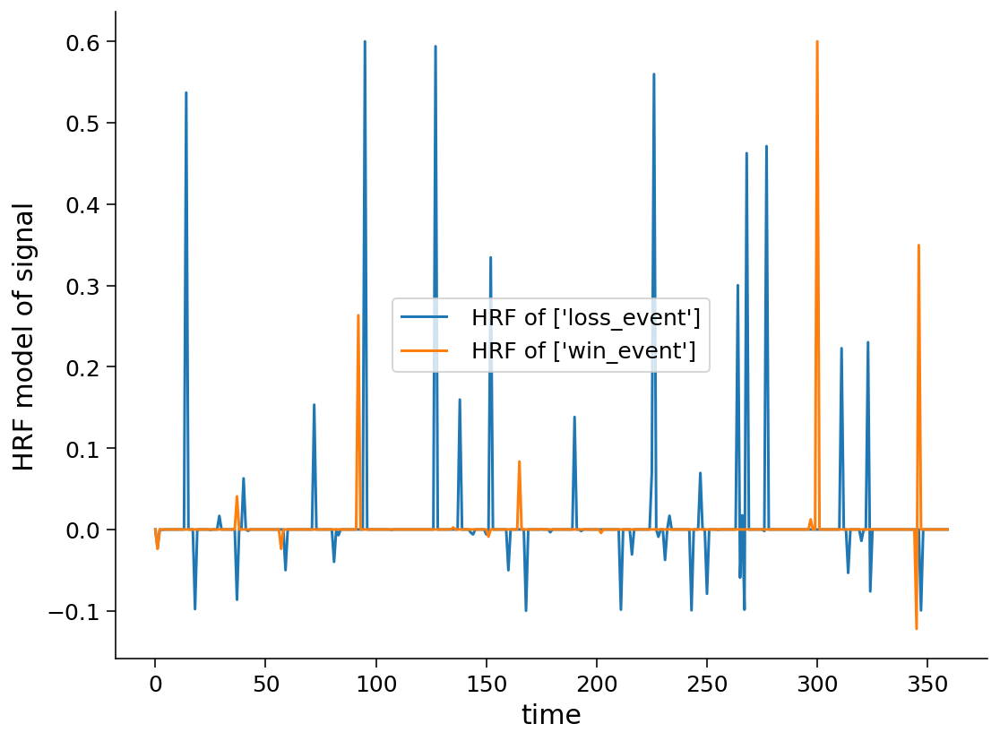

In [24]:
#calculating hemodynamic responses
#referrence: http://www.jarrodmillman.com/rcsds/lectures/convolution_background.html
def hrf(times):
     """ Return values for HRF at given times """
     # Gamma pdf for the peak
     peak_values = gamma.pdf(times, 6)
     # Gamma pdf for the undershoot
     undershoot_values = gamma.pdf(times, 12)
     # Combine them
     values = peak_values - 0.35 * undershoot_values
     # Scale max to 0.6
     return values / np.max(values) * 0.6




for i in ['loss_event','win_event']:
  sub0_par0_cond = load_timeseries(subject=0, name="GAMBLING", runs=0)[:, condition_frames(load_evs(0 , 'GAMBLING' , i))[0][0]  ]
  plt.plot( hrf(sub0_par0_cond) , label=f" HRF of {[i]}" )
plt.xlabel('time')
plt.ylabel('HRF model of signal')
plt.legend()
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in true_divide
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':


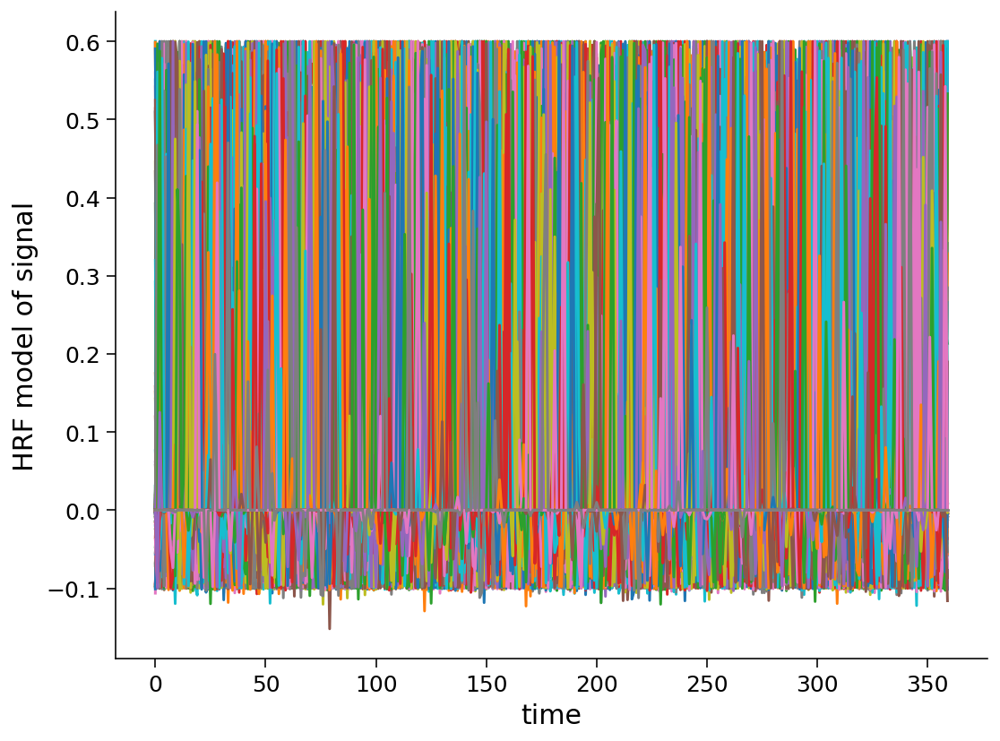

In [25]:
for i in ['loss_event','win_event']:
  for sub in subjects:
    sub_par_cond = load_timeseries(subject=sub, name="GAMBLING", runs=0)[:, condition_frames(load_evs(sub , 'GAMBLING' , i))[0][0] ]
    plt.plot( hrf(sub_par_cond))#[0])-hrf(sub_par_cond[1])) # , label=f" HRF of {[i]}" )
plt.xlabel('time')
plt.ylabel('HRF model of signal')
#plt.legend()
plt.show()

In [26]:
print(sub_par_cond)

[-3.84339921e+01  3.86016601e+01  3.88996047e+01 -4.44636364e+01
 -2.23083004e+00 -2.70478261e+01  5.93249012e+01 -4.24620553e+01
 -4.56860474e+01  2.35503953e+01  4.84932806e+01 -1.13794466e+00
 -1.06184190e+02 -3.79509881e+01 -2.99944664e+01 -6.18181818e-01
 -3.75312253e+01 -5.70158103e+00 -7.46936759e+01  3.60361660e+01
 -8.33050988e+01 -3.08406324e+01  7.89374308e+01  1.17288538e+01
  2.50079051e+01 -4.01565217e+01 -3.83043478e+00  2.24422925e+00
  3.98675889e+01  5.89948617e+01 -3.43256917e+01  1.94292885e+02
 -1.00579447e+02  6.85494071e+00 -2.93549407e+01 -7.50710672e+01
 -8.20916996e+00 -4.26241107e+01 -6.78833202e+01  3.55707510e+01
 -1.33873518e+01 -1.02535968e+01  2.09644269e+00 -1.30474308e+00
  5.05536364e+01 -1.03488142e+02  9.18889328e+00 -5.39904348e+01
 -6.71134387e+01 -5.22210277e+01 -1.86127668e+01  2.16067194e+00
 -6.09130435e+01  9.46873518e+00  2.02205534e+01  1.58735178e-01
  2.71715415e+01 -9.83332016e+01 -7.92094862e-01 -2.51158103e+01
  4.24448221e+02  3.11833

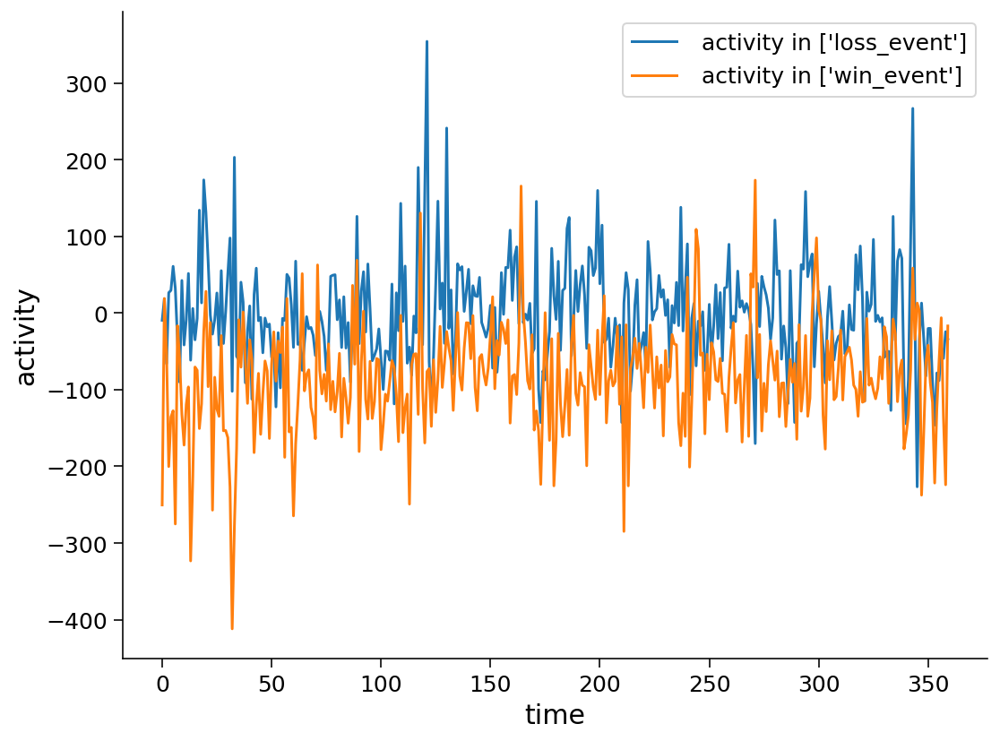

In [27]:
for i in ['loss_event','win_event']:
  sub0_par0_cond = load_timeseries(subject=0, name="GAMBLING", runs=0)[:, condition_frames(load_evs(0 , 'GAMBLING' , i))[0][0]  ]
  plt.plot( sub0_par0_cond , label=f" activity in {[i]}" )
plt.xlabel('time')
plt.ylabel('activity')
plt.legend()
plt.show()

# sub0_par0_condloss = load_timeseries(subject=0, name="GAMBLING", runs=0)[:, condition_frames(load_evs(0 , 'GAMBLING' , 'loss_event'))[0][0]  ]
# sub0_par0_condwin = load_timeseries(subject=0, name="GAMBLING", runs=0)[:, condition_frames(load_evs(0 , 'GAMBLING' , 'win_event'))[0][0]  ]
# contrast_sub0_par0 = sub0_par0_condloss - sub0_par0_condwin
# plt.plot(contrast_sub0_par0)

In [28]:
loss_event_df.head() # subjects x Parcels

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359
0,26.795921,15.524843,-2.774477,24.049802,19.533365,30.011120,29.478208,-7.721137,-11.472666,12.678906,15.706843,11.437228,23.135610,14.942951,16.627289,23.681370,19.221307,28.485908,10.627784,26.448798,23.605908,33.612657,12.357128,-4.146856,6.951894,0.037744,11.708928,1.305437,20.433765,18.207763,-0.752601,2.487631,17.348922,-1.806661,1.538292,-4.018850,-8.524290,-6.963188,-1.773302,-9.432026,...,7.037070,14.227136,3.593808,11.897772,21.805196,18.025159,14.040781,2.411919,1.044323,-8.078545,-4.268601,-4.453202,-0.904316,9.426398,-1.014851,37.443614,16.776390,21.595368,28.142340,2.398793,-8.603404,-14.947125,17.862134,-11.630934,-44.049219,-3.432505,-9.120237,-1.849049,1.632111,-7.352912,-5.866271,-10.651679,1.272606,15.915236,5.200727,-29.390540,2.652457,-5.763304,7.013681,-3.761302
1,11.282349,-0.334630,-16.693467,13.151270,2.703365,6.478797,18.922580,-12.028768,-16.721170,14.337458,23.862640,13.367907,-6.112998,-21.217628,-3.547312,-18.900610,-21.313365,10.503916,-7.389848,1.603354,9.563350,3.553737,-13.523049,8.768533,6.786351,14.772422,7.169774,4.026778,4.419034,-6.361767,-24.895353,-9.725037,-43.620858,19.996906,-15.300813,-14.103045,-20.895076,-3.332812,-30.232561,-3.829097,...,-7.236369,-23.362005,-16.209814,-1.408189,6.067713,-16.150333,-3.585985,-3.044124,-5.726072,-10.736100,-21.198560,-65.843964,-13.759853,-3.309113,-11.384534,-0.277270,-4.285375,-0.583625,3.845335,-4.196578,-45.788470,-30.239763,-13.090734,-13.741149,-7.945182,-1.160744,-20.836256,-23.559565,18.555455,-8.850384,1.131220,-17.490409,-13.314269,5.284540,-6.066606,-8.542264,-6.572229,-16.303535,27.705765,15.769339
2,9.896344,6.345774,0.166171,9.261773,-3.816271,6.929499,11.627246,-7.003582,-7.369287,1.858737,14.640764,2.573634,1.827995,3.755515,14.574451,-7.648657,0.559152,14.895070,2.721278,18.435531,5.432138,5.726443,6.638968,-18.322920,1.727189,-1.371626,-0.249797,-2.330748,4.179067,-0.077908,-2.266045,-11.829903,-13.204854,-7.272190,-1.841107,-3.764885,-19.442198,-9.044553,-11.525963,-2.666809,...,2.087282,-11.732153,-2.542135,10.206403,-1.222106,14.781639,13.130154,-2.050831,-8.594442,-7.159616,-4.459390,-7.587141,-11.426783,12.821323,-7.796570,18.276150,10.601613,6.711635,-2.565308,-7.099989,-6.863995,-1.948590,9.470229,-10.989599,-1.672431,-0.645581,2.894414,-5.806329,12.499289,2.684896,-6.015810,-8.469075,-16.881123,-3.077817,-0.012128,-9.703062,-2.377503,7.195051,-0.795447,-10.407310
3,-6.670886,2.258308,-10.693320,-6.305694,-14.824167,-7.654569,-2.074307,-6.672680,-2.061121,5.722273,8.203447,-3.727649,-7.446098,-2.194359,-2.124529,-10.464759,0.878967,2.177426,-3.116619,11.682725,-1.636333,-1.128917,4.146729,-19.755762,1.834180,-4.659966,2.014105,-6.054239,-9.913597,2.529497,-5.630311,-7.625494,10.313947,-18.107318,-5.860875,-9.689837,-8.550232,-3.392818,-6.659847,-6.208080,...,8.490403,-13.270265,-14.376245,-16.091755,-6.195890,3.627299,11.772935,-5.773232,-7.357196,-7.494095,-4.513087,-7.828499,-4.882050,-5.299757,-25.984854,12.423584,2.063676,3.861615,-7.704355,-12.307205,-4.826098,-9.799334,11.922089,16.017814,-3.056709,10.812106,5.551208,-0.358114,-4.524619,-9.952953,-23.188583,-9.574122,-21.746482,-9.731569,0.678261,-11.363094,-0.100019,1.941225,-9.682309,0.649209
4,43.683088,15.511073,21.860343,35.692395,26.305144,28.486809,32.206639,-4.061152,-3.623038,13.523204,4.311779,8.339242,24.433152,-6.993945,8.723814,3.345833,7.831092,18.847455,32.362653,29.291733,15.486838,31.555903,5.279471,-2.552204,7.035517,10.564116,6.560924,9.782259,16.924851,-2.486398,-9.745470,-2.073491,-22.533175,-6.134129,-3.360959,-0.411719,-6.897040,8.001365,-0.271357,-17.633302,...,11.062535,6.529286,-1.136962,6.867393,4.807822,18.750937,9.603087,4.518706,5.775116,-8.503349,-11.663988,2.885241

## Mean of HRF of all subjects across all parcels 

In [29]:
hrf(load_timeseries(subject=0, name="GAMBLING", runs=0))

array([[-8.56190251e-02, -9.04198973e-02,  0.00000000e+00, ...,
        -8.65754610e-16, -6.61037070e-04,  5.67018395e-01],
       [ 0.00000000e+00, -8.82712242e-05,  0.00000000e+00, ...,
        -1.44541899e-04,  0.00000000e+00,  3.71627760e-01],
       [-3.13497834e-45, -2.33431516e-33, -1.25259811e-20, ...,
        -4.32472423e-15, -3.14214990e-02,  0.00000000e+00],
       ...,
       [-8.16499460e-13,  0.00000000e+00,  5.00454644e-02, ...,
        -4.15732809e-14, -1.20617807e-42, -4.99352372e-15],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
        -1.20878930e-11, -7.54836651e-02, -3.02423987e-35],
       [-1.76329659e-14,  0.00000000e+00,  0.00000000e+00, ...,
        -3.86959780e-04, -1.44290687e-06, -7.74001388e-35]])

In [30]:
win_event_array=[] 
for sub in subjects:
    for i in [0,1]:
         win_event_array.append( hrf(load_timeseries(subject=sub, name="GAMBLING", runs=i))[:, condition_frames(load_evs( sub , 'GAMBLING' , 'win_event'))[i]  ].mean( axis=1))

win_event_df_hrf = pd.DataFrame( win_event_array )

In [31]:
win_event_df_hrf

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359
0,0.010631,0.022841,0.001897,0.016454,0.017148,0.014016,0.022168,0.013238,0.005874,0.011185,0.006095,0.015003,0.013842,0.021548,0.005801,0.012159,0.030145,0.017662,0.012646,0.008432,0.003666,0.006370,0.014836,0.005504,0.002766,-0.001882,0.008507,0.002642,0.028469,-0.006614,0.006606,0.011636,0.004746,0.008000,-0.001432,0.015139,0.006503,-0.001416,-0.000270,0.008549,...,0.007347,-0.007075,0.002262,0.010314,0.011163,0.016624,0.003530,0.011981,0.031606,-0.000874,-0.002437,-0.001300,0.002741,0.012004,0.015747,0.003956,0.010315,0.003769,0.020709,-0.002074,0.006106,0.011893,0.023887,-0.001386,0.006505,0.005418,0.014607,-0.005225,-0.002165,0.011098,0.016981,0.019687,-0.001177,0.000053,0.010464,0.040573,0.007026,0.007152,0.004642,0.011645
1,0.033529,0.002790,0.014082,0.026110,0.012531,0.007538,0.009258,0.035819,0.018182,0.001019,0.022483,0.035644,0.019102,0.009001,0.006554,0.005038,0.012320,0.013489,0.004140,0.029194,0.012815,0.017469,0.026340,0.019473,0.011709,0.008480,0.000798,0.027453,0.025751,0.019541,-0.003773,0.022397,0.010864,0.005811,0.000852,0.030408,0.023280,0.016064,0.025472,0.014810,...,-0.001356,0.005071,0.025459,0.011429,-0.000617,0.024084,0.017269,0.005776,0.003350,0.010391,0.037089,0.002502,0.004690,0.010890,0.001161,0.016934,0.010508,0.013158,0.011418,0.021907,-0.001790,0.012668,-0.001230,0.005172,0.000818,0.018554,0.003083,0.001043,0.006984,0.013910,0.001611,0.018639,0.013006,0.019006,0.029886,0.009718,0.021335,-0.001752,0.000739,-0.005246
2,0.028124,0.021827,0.017818,0.006849,0.056222,0.005960,-0.000905,0.009135,0.031363,0.036736,0.008252,0.007924,0.004067,0.005102,0.057123,0.008235,0.002014,-0.010279,0.012707,0.001914,0.046081,0.009707,0.032461,0.007232,0.048596,0.010865,0.018321,0.030125,0.034798,0.007954,0.022060,0.029919,0.009087,0.010264,0.002877,0.009311,0.013900,0.029113,0.040896,0.008170,...,0.038064,0.017862,0.026807,0.043097,0.028631,0.015101,0.025297,0.027436,0.019338,0.015397,0.025318,0.022713,0.004682,0.005844,0.013667,0.014678,0.020326,0.002335,0.029652,0.005726,0.005464,0.020272,0.012687,0.011393,0.010543,0.011603,0.018534,0.015514,0.024045,0.027189,0.010075,0.012273,0.004010,0.002774,0.016763,0.003757,0.007465,0.000992,0.023383,0.008266
3,0.043785,0.044588,0.022849,0.058418,0.022969,0.039010,0.015741,0.030751,0.030832,0.017022,0.005502,0.013718,0.004169,0.017177,0.015354,0.023033,0.002090,0.019170,0.023823,0.004559,0.022847,0.020599,0.033387,0.002142,0.039561,0.009641,0.020364,0.079042,0.001210,0.043539,0.013527,0.017740,0.011760,0.003715,0.005446,0.021989,0.021102,0.027014,0.020836,0.031806,...,0.014252,0.026227,0.005758,0.000600,0.003100,0.034679,0.021449,0.015572,0.012535,0.069054,0.022358,0.021110,0.010624,0.010494,0.009595,0.005078,0.042870,0.015083,0.024506,0.006687,-0.004401,0.019631,0.006973,-0.002080,0.011155,0.021441,0.036439,0.018153,0.027227,0.024550,0.009243,0.018711,0.017784,0.010453,0.008699,0.008638,0.034295,0.020149,0.009862,0.004933
4,0.020649,0.024900,0.019406,0.004271,0.042575,0.052150,0.010725,0.043276,0.028589,0.047385,0.024550,0.028459,0.051733,0.026990,0.018390,0.012627,0.019892,0.021845,0.015235,0.026179,0.008056,0.013217,0.045343,0.018522,0.074054,-0.001332,0.030125,0.012249,0.030934,0.021467,0.024055,0.026215,0.013448,0.010598,0.009881,0.047171,0.025397,0.030232,0.016143,0.042248,...,0.025365,0.037745,0.041978,0.011626,0.000255,0.023006,0.009570,0.018071,0.012939,0.022357,0.016368,0.010471,0.022278,0.017044,0.006076,0.011719,0.003195,0.003753,0.014952,0.001645,0.038911,0.012482,0.018383,0.000919,0.001066,0.024010,0.055691,0.015077,-0.002770,-0.003191,0.009436,-0.000574,0.017844,0.024082,0.060825,0.006949,0.001404,0.040300,0.001932,0.000338
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [32]:
loss_event_array=[] 
for sub in subjects:
    for i in [0,1]:
        loss_event_array.append( hrf(load_timeseries(subject=sub, name="GAMBLING", runs=i))[:, condition_frames(load_evs( sub , 'GAMBLING' , 'loss_event'))[i]  ].mean( axis=1))

loss_event_df_hrf= pd.DataFrame( loss_event_array )

In [33]:
loss_event_df_hrf

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359
0,0.014122,0.012740,0.016872,0.022694,0.023064,0.032284,0.013758,0.029515,0.004565,0.033417,0.023068,0.011024,0.020891,0.015704,0.036383,0.012940,0.017234,0.019177,0.007280,0.004995,0.008602,0.016055,0.034652,0.012938,0.007955,0.011060,0.027989,0.023984,0.001266,0.027330,0.013486,0.001058,-0.004334,0.006899,-0.003545,0.004565,-0.005659,-0.002913,0.014063,0.007969,...,0.017210,0.019717,0.042536,0.005036,0.010691,0.033095,0.016728,0.037870,0.004527,0.027740,0.019712,0.010238,0.001449,-0.001976,0.017484,0.018246,0.018582,0.022168,0.015631,0.013135,0.016289,0.000446,-0.001636,0.005635,0.011755,8.898963e-03,0.004412,0.021077,0.015598,0.003387,-0.001474,0.002204,0.030997,0.006130,0.011260,0.002544,0.035719,0.012944,0.008940,0.010936
1,0.008674,0.005007,0.007574,0.007613,0.011078,-0.003072,0.003892,0.006982,0.010698,0.022137,0.003780,0.017648,0.012613,0.010732,0.018011,-0.005682,0.002446,0.008336,0.010104,0.005584,0.017947,0.024572,-0.001070,-0.000511,0.006455,0.012649,-0.003143,0.007132,0.047170,0.009172,-0.000249,0.006533,0.002457,0.001118,0.001185,0.025161,0.013954,-0.000807,0.019219,0.000211,...,0.009094,0.002384,0.007623,0.034919,0.005063,0.020147,0.027967,0.009414,0.010374,0.011234,0.013768,0.007916,0.009184,0.004907,-0.002443,0.020792,0.008863,0.014632,-0.000697,0.006411,-0.001189,0.005022,0.001047,0.010964,0.009906,-2.732351e-03,0.003444,0.004158,0.012205,-0.001521,0.020791,0.013758,0.007803,0.017173,0.008507,0.003819,0.012553,0.005536,0.011098,0.003221
2,0.017710,0.056770,0.042945,0.023389,0.009426,0.021733,0.011587,0.039805,0.031724,0.058059,0.007914,0.075387,0.022501,0.004696,0.014103,0.034173,0.012088,0.022605,0.016386,0.038734,0.035627,0.021252,0.048769,0.042179,0.023237,0.023607,-0.003040,0.018366,0.010428,0.032141,0.007628,0.018096,0.005324,0.008041,-0.000776,0.045714,0.027280,0.011492,0.025830,0.012418,...,0.028162,0.020519,0.022550,0.016198,0.010206,0.024627,0.025230,0.039752,0.020419,0.046069,0.021287,0.017138,0.006434,0.015970,0.012195,0.020196,0.016014,0.034365,0.020866,0.006976,0.016119,-0.003763,0.001096,0.019621,-0.004967,6.446080e-03,0.011515,0.013610,0.001122,0.004108,0.021041,0.016438,0.021388,0.022733,0.034715,0.013403,0.008952,0.018630,0.020644,0.017917
3,0.012781,0.050928,0.013500,0.052272,0.031360,0.022770,0.001881,0.029591,0.045330,0.017249,-0.002089,0.038956,0.006229,0.001740,0.008386,0.011106,0.016611,0.025763,-0.001486,0.014932,0.036480,0.021509,0.024474,0.032624,0.023098,0.024804,0.005604,0.063390,-0.003321,0.012570,0.024600,0.005296,0.012454,0.012620,0.010310,0.020835,0.007274,-0.001338,0.029403,0.027230,...,0.049459,0.042250,0.030256,0.026661,0.007425,0.012451,0.026747,0.040987,0.036251,0.030805,0.030672,0.030878,0.002143,0.018292,0.019534,0.013102,0.031547,0.009616,0.048371,0.000644,0.006198,0.004068,0.012977,-0.000792,0.025155,1.755055e-02,0.016352,-0.001596,-0.001350,0.033919,0.006904,0.026135,0.010701,0.025336,0.075958,0.009972,0.020106,0.015442,-0.004688,0.003615
4,0.007027,0.017569,0.025175,0.026333,0.034939,0.012709,0.008015,0.055068,0.030928,0.028521,0.017069,0.011227,0.016586,0.030189,0.001099,0.027615,0.052419,0.012802,0.002035,0.010069,0.008707,0.006841,0.012034,0.005201,0.024081,0.002808,0.002657,0.019838,0.001824,0.018519,0.022401,0.001662,0.006190,0.016748,0.010952,0.004268,0.021014,0.005168,0.059215,0.038307,...,-0.007223,0.030307,0.030789,0.020785,-0.003584,-0.001203,0.036052,0.008005,0.018987,0.021608,0.030040,0.014541,0.005988,0.003277,0.009598,0.004571,-0.002457,0.007021,0.004386,0.020011,0.045044,0.009129,0.036369,0.004586,-0.001429,-1.623737e-05,-0.000628,0.015095,0.016667,0.044974,0.019971,0.032341,0.031662,0.004018,0.019176,0.015529,0.005218,0.002153,-0.003127,0.017291
...,...,...,...,...,...,...,...,...,

## Actual mean of subj acr par

In [34]:
loss_event_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359
0,26.795921,15.524843,-2.774477,24.049802,19.533365,30.011120,29.478208,-7.721137,-11.472666,12.678906,15.706843,11.437228,23.135610,14.942951,16.627289,23.681370,19.221307,28.485908,10.627784,26.448798,23.605908,33.612657,12.357128,-4.146856,6.951894,0.037744,11.708928,1.305437,20.433765,18.207763,-0.752601,2.487631,17.348922,-1.806661,1.538292,-4.018850,-8.524290,-6.963188,-1.773302,-9.432026,...,7.037070,14.227136,3.593808,11.897772,21.805196,18.025159,14.040781,2.411919,1.044323,-8.078545,-4.268601,-4.453202,-0.904316,9.426398,-1.014851,37.443614,16.776390,21.595368,28.142340,2.398793,-8.603404,-14.947125,17.862134,-11.630934,-44.049219,-3.432505,-9.120237,-1.849049,1.632111,-7.352912,-5.866271,-10.651679,1.272606,15.915236,5.200727,-29.390540,2.652457,-5.763304,7.013681,-3.761302
1,11.282349,-0.334630,-16.693467,13.151270,2.703365,6.478797,18.922580,-12.028768,-16.721170,14.337458,23.862640,13.367907,-6.112998,-21.217628,-3.547312,-18.900610,-21.313365,10.503916,-7.389848,1.603354,9.563350,3.553737,-13.523049,8.768533,6.786351,14.772422,7.169774,4.026778,4.419034,-6.361767,-24.895353,-9.725037,-43.620858,19.996906,-15.300813,-14.103045,-20.895076,-3.332812,-30.232561,-3.829097,...,-7.236369,-23.362005,-16.209814,-1.408189,6.067713,-16.150333,-3.585985,-3.044124,-5.726072,-10.736100,-21.198560,-65.843964,-13.759853,-3.309113,-11.384534,-0.277270,-4.285375,-0.583625,3.845335,-4.196578,-45.788470,-30.239763,-13.090734,-13.741149,-7.945182,-1.160744,-20.836256,-23.559565,18.555455,-8.850384,1.131220,-17.490409,-13.314269,5.284540,-6.066606,-8.542264,-6.572229,-16.303535,27.705765,15.769339
2,9.896344,6.345774,0.166171,9.261773,-3.816271,6.929499,11.627246,-7.003582,-7.369287,1.858737,14.640764,2.573634,1.827995,3.755515,14.574451,-7.648657,0.559152,14.895070,2.721278,18.435531,5.432138,5.726443,6.638968,-18.322920,1.727189,-1.371626,-0.249797,-2.330748,4.179067,-0.077908,-2.266045,-11.829903,-13.204854,-7.272190,-1.841107,-3.764885,-19.442198,-9.044553,-11.525963,-2.666809,...,2.087282,-11.732153,-2.542135,10.206403,-1.222106,14.781639,13.130154,-2.050831,-8.594442,-7.159616,-4.459390,-7.587141,-11.426783,12.821323,-7.796570,18.276150,10.601613,6.711635,-2.565308,-7.099989,-6.863995,-1.948590,9.470229,-10.989599,-1.672431,-0.645581,2.894414,-5.806329,12.499289,2.684896,-6.015810,-8.469075,-16.881123,-3.077817,-0.012128,-9.703062,-2.377503,7.195051,-0.795447,-10.407310
3,-6.670886,2.258308,-10.693320,-6.305694,-14.824167,-7.654569,-2.074307,-6.672680,-2.061121,5.722273,8.203447,-3.727649,-7.446098,-2.194359,-2.124529,-10.464759,0.878967,2.177426,-3.116619,11.682725,-1.636333,-1.128917,4.146729,-19.755762,1.834180,-4.659966,2.014105,-6.054239,-9.913597,2.529497,-5.630311,-7.625494,10.313947,-18.107318,-5.860875,-9.689837,-8.550232,-3.392818,-6.659847,-6.208080,...,8.490403,-13.270265,-14.376245,-16.091755,-6.195890,3.627299,11.772935,-5.773232,-7.357196,-7.494095,-4.513087,-7.828499,-4.882050,-5.299757,-25.984854,12.423584,2.063676,3.861615,-7.704355,-12.307205,-4.826098,-9.799334,11.922089,16.017814,-3.056709,10.812106,5.551208,-0.358114,-4.524619,-9.952953,-23.188583,-9.574122,-21.746482,-9.731569,0.678261,-11.363094,-0.100019,1.941225,-9.682309,0.649209
4,43.683088,15.511073,21.860343,35.692395,26.305144,28.486809,32.206639,-4.061152,-3.623038,13.523204,4.311779,8.339242,24.433152,-6.993945,8.723814,3.345833,7.831092,18.847455,32.362653,29.291733,15.486838,31.555903,5.279471,-2.552204,7.035517,10.564116,6.560924,9.782259,16.924851,-2.486398,-9.745470,-2.073491,-22.533175,-6.134129,-3.360959,-0.411719,-6.897040,8.001365,-0.271357,-17.633302,...,11.062535,6.529286,-1.136962,6.867393,4.807822,18.750937,9.603087,4.518706,5.775116,-8.503349,-11.663988,2.885241

In [35]:
win_event_array=[] 
for sub in subjects:
    for i in [0,1]:
         win_event_array.append( load_timeseries(subject=sub, name="GAMBLING", runs=i)[:, condition_frames(load_evs( sub , 'GAMBLING' , 'win_event'))[i]  ].mean( axis=1))

win_event_df= pd.DataFrame( win_event_array )

In [36]:
win_event_df # subjects x Parcels

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359
0,-37.167771,-1.252490,-38.172733,-28.867121,-22.062122,-21.523752,-12.662305,-19.154860,-33.850625,-19.262273,-20.042019,-19.397295,-27.169723,-28.689869,-36.049942,-23.434527,-20.731821,-24.565990,-26.172934,-7.576279,6.820010,-29.507056,-8.766677,-49.531882,-12.297265,-23.061435,-27.778662,-10.482522,-32.592593,-35.695622,-36.256601,-32.705497,-38.360103,-28.944713,-14.813092,-30.905691,-27.790033,-19.294983,-30.735968,-26.953360,...,-9.848981,-29.567121,-9.551833,-17.089489,-15.857470,-17.009097,-36.946255,-17.691117,-14.883656,-22.343776,-16.542755,-39.782432,-30.734162,-36.307346,-26.658133,-19.379955,-3.764123,-5.297555,-5.329352,-48.793104,-57.174071,-29.909997,-21.267096,-28.358606,-31.002409,-43.812679,-18.535622,-37.009869,-40.222043,-30.253937,-32.202682,-8.443464,-32.877343,-45.268969,-31.464350,-13.094643,-15.000753,-7.142074,-30.203344,-44.519045
1,8.811813,1.639298,-6.292574,5.818592,6.831937,11.920583,26.425973,-2.788215,-12.796420,2.072101,9.561158,1.428211,17.356823,20.928622,21.635188,18.623676,13.165563,12.742702,-0.922169,23.018533,26.722279,11.797058,0.188629,-1.322574,4.906261,2.977065,1.396917,5.408796,15.638320,8.290375,18.600183,9.990499,41.841285,-10.771487,10.901151,-4.425742,-10.237041,-6.616383,4.954796,-12.773918,...,12.623809,-1.067362,8.465543,6.525276,17.046285,22.463953,3.875658,-2.681446,1.880713,-2.716064,3.382154,-6.791107,4.328004,2.692851,0.217609,13.786266,12.343375,21.377268,21.610871,-15.128542,-2.691863,-12.402263,8.937480,3.054298,3.342318,2.366167,-3.217149,3.877935,-4.985795,1.108009,1.443898,4.577270,6.685499,-4.352782,6.468305,-6.866907,-0.840622,8.159501,5.183444,13.936482
2,-14.191738,4.465241,-8.241624,-6.603653,-10.820076,-5.459834,1.725298,-12.476485,-7.506385,1.307629,2.453431,-13.757853,-4.127595,-27.804895,-12.062165,-4.466339,-5.922797,0.944240,-5.967748,-1.416274,-2.005011,-7.351413,-3.637258,-19.285484,-8.223190,-23.808446,-6.565284,-7.151723,-14.639702,-18.147856,-10.500711,-39.881800,-22.728854,-39.367267,-52.562645,-18.673039,-3.702505,-18.886707,-8.574691,-12.746604,...,5.437415,2.092052,-6.687355,-9.376664,-12.691881,2.714357,-5.646379,-10.024359,-18.704770,-16.974170,-21.463267,-2.340474,-1.719398,-7.509036,-33.654242,-9.164465,-3.792849,-14.322334,-4.344323,-8.512502,-34.209328,-32.346026,-1.868848,-45.336635,-18.194205,-42.700043,-14.729176,-12.300073,-39.579173,-37.359617,-31.828118,-0.752460,-16.890046,-22.468463,-14.479790,-16.755780,-26.301492,0.685205,-31.030216,-28.035822
3,1.047257,3.247308,-9.142070,-3.651623,-8.312024,-3.595319,2.152515,-7.788805,-5.243532,5.011255,21.862447,-7.589739,-12.955741,-5.692752,-2.136314,-14.585009,1.024145,8.863694,1.311453,-3.867329,3.025203,4.286208,-2.631450,-7.361280,1.290484,-14.331038,6.484284,7.171440,29.002653,-9.305860,-6.824239,-22.320494,-44.687125,-10.028389,-26.516947,-6.979980,-11.366660,-1.929960,-8.815186,-6.600044,...,8.587295,-3.573123,4.652755,23.512245,10.054003,16.970585,14.801989,6.854715,-2.355750,-9.926345,-14.707337,-10.458731,-31.288478,-4.238686,-11.085354,-8.375880,4.874159,-4.575599,-4.324515,-25.514348,-22.251991,-17.761655,4.276018,-30.738043,-10.871423,-10.180751,-8.304506,-0.624007,11.426453,-17.854560,0.520346,-8.767515,-16.677732,-6.711319,-7.898239,-18.640237,-14.198054,-10.190025,2.043226,-20.489541
4,-0.538553,10.653729,-6.528016,8.109626,3.486580,4.108142,9.730967,-5.546270,-7.116525,-0.177616,-10.814375,-4.974009,2.101193,-4.110252,-8.291806,0.295228,-6.154015,6.066224,5.930859,2.160000,-1.285787,1.967031,7.964076,-12.579763,-5.572472,-28.865217,-7.125517,-2.678162,-6.597088,-8.760347,-16.922086,-5.538620,-29.702919,-12.283770,-23.054600,-6.914724,-8.764496,-5.200584,-8.700178,5.285570,...,5.231355,-0.674509,-7.4

## Correlation Contrast

           0          1          2    ...        357        358        359
0   -63.963692 -16.777333 -35.398256  ...  -1.378769 -37.217026 -40.757744
1    -2.470536   1.973929  10.400893  ...  24.463036 -22.522321  -1.832857
2   -24.088082  -1.880533  -8.407795  ...  -6.509846 -30.234769 -17.628513
3     7.718143   0.989000   1.551250  ... -12.131250  11.725536 -21.138750
4   -44.221641  -4.857344 -28.388359  ...   3.148513 -10.917744  10.728410
..         ...        ...        ...  ...        ...        ...        ...
673  34.148929  20.647500  13.770536  ...  22.498036  11.110714  21.390536
674  -7.987385  19.088964   7.287897  ...  22.380923 -15.441231  12.306667
675  31.468036  11.811750   4.242321  ... -12.226250  -0.510000   6.316429
676   4.977846  16.583641  20.403487  ...  -8.349846  47.958974  41.486154
677   7.686250  -7.169179  -5.097321  ...   1.180536  20.742321 -14.864643

[678 rows x 360 columns]


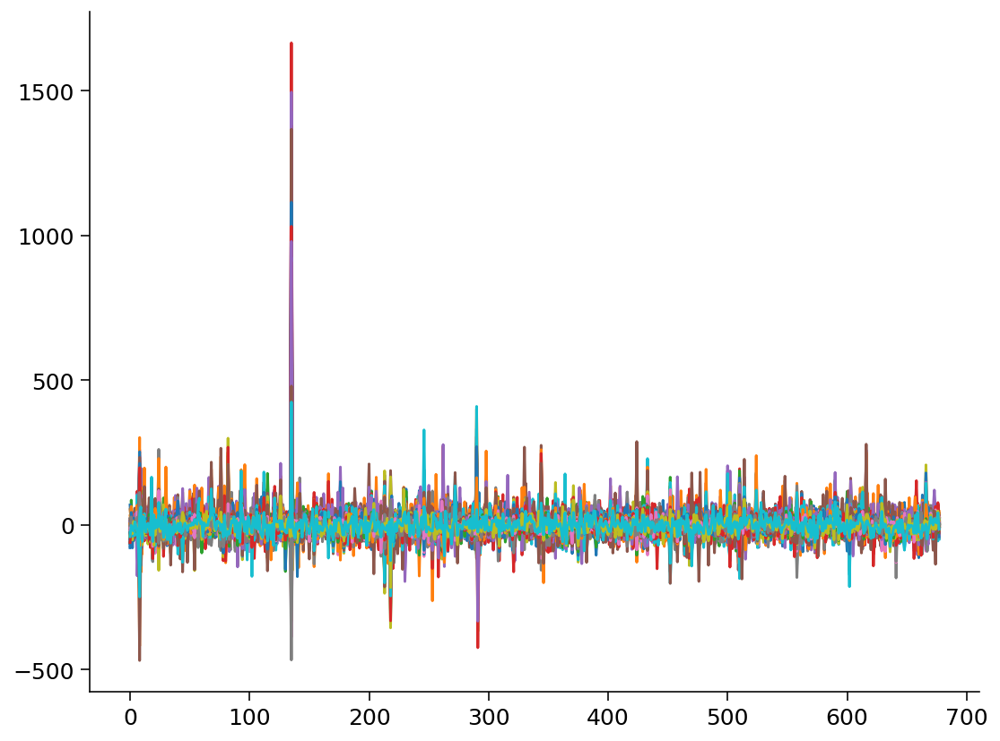

In [109]:
contrast = win_event_df - loss_event_df
plt.plot(contrast)
print(contrast)

In [111]:
describtion= contrast.describe()
describtion


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359
count,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,...,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000
mean,-4.559538,-1.462317,-0.706125,-3.664335,-1.127502,-3.839721,-4.105242,0.929529,0.859521,-1.695776,-3.428895,-1.393031,0.037052,-1.151073,-3.822672,0.662372,1.076328,-3.528890,-2.799483,-1.073113,-0.972966,-4.135817,-1.641658,-0.628703,-1.721643,-3.925339,-1.014463,-0.648157,-2.505396,-0.656673,1.169820,-2.668527,0.906014,1.703364,-0.774075,-0.169797,0.919652,-0.915734,-0.496928,0.865422,...,1.053863,1.149329,2.168989,0.068920,1.363760,-0.277938,-0.931045,-0.086869,0.563895,2.907291,2.972932,1.389099,-1.057979,-3.309635,1.667797,-2.667705,-1.173872,-0.552182,-0.289878,-0.499634,3.945155,4.309923,-3.234901,0.179842,11.051067,2.850850,-1.744011,-1.303700,-2.545379,4.268720,5.253540,-1.543018,-2.113851,-1.551193,-1.760218,2.154783,-0.832660,-2.761223,-3.949544,-0.999788
std,21.382433,14.657599,17.130066,18.479116,17.645309,18.137572,23.951740,13.057801,14.518730,15.306890,18.634919,14.644545,16.966220,26.375789,19.226058,18.570913,17.383506,16.472815,17.992075,17.172001,19.714926,22.547343,14.512787,21.668245,13.548614,21.955668,17.949283,13.506575,22.264238,19.214260,23.760498,26.355695,30.233974,29.905935,26.543137,17.534734,16.550538,18.625572,15.245609,18.506988,...,16.471529,14.612687,13.838605,16.770925,17.899452,16.546037,14.930371,11.861875,13.700014,14.108297,13.856358,16.216190,27.672480,23.904635,27.651278,17.812758,14.413055,16.802544,16.320193,29.621192,22.446557,22.431920,18.798990,54.549010,59.844260,61.161967,23.402116,27.002706,25.161665,42.047651,28.957619,26.435178,20.770712,24.382494,13.383787,21.724425,19.232706,20.871418,27.300488,29.203549
min,-63.963692,-69.563911,-82.860357,-53.574359,-70.110071,-88.000768,-98.376429,-41.955607,-77.150554,-67.438750,-92.200103,-64.221549,-74.605714,-89.836607,-76.557949,-125.638051,-83.056615,-68.440696,-78.241949,-79.441333,-134.401214,-145.993464,-66.688929,-119.921339,-54.214268,-161.243214,-70.817857,-46.326903,-156.427692,-84.598929,-109.146964,-113.842154,-162.607857,-203.442857,-120.441846,-73.006518,-70.098393,-102.396786,-116.614462,-180.977071,...,-59.967250,-59.099795,-52.149128,-64.346677,-66.699856,-50.583571,-78.378831,-34.587161,-47.625536,-38.561679,-43.501107,-82.334462,-190.010179,-119.420714,-182.448923,-106.957538,-48.437056,-51.134154,-158.133241,-200.288214,-62.540357,-74.207857,-67.459692,-424.457250,-332.646500,-468.697600,-93.659795,-96.972500,-94.865536,-248.836615,-156.126667,-142.488154,-104.405128,-109.813436,-52.248410,-91.778800,-96.684995,-133.699286,-216.442256,-123.398872
25%,-19.563179,-9.170734,-10.411330,-15.381374,-12.083870,-14.900995,-16.894058,-6.131946,-7.591696,-10.791539,-13.765233,-9.527610,-9.223214,-16.154084,-14.534107,-8.631527,-8.452753,-13.090526,-13.388348,-11.388208,-11.879772,-17.121172,-9.020009,-12.687831,-9.746259,-16.274487,-10.691846,-8.695570,-14.233795,-11.315538,-1

# Highest/Lowest 10 parcel activity

In [129]:
highest_10= np.argsort(describtion.max())[::-1][:10].to_numpy()
highest_10

array([ 63,  64, 164,  93, 165,  60,  87, 240,  65,  92])

In [130]:
lowest_10= np.argsort(describtion.min())[:10].to_numpy()
lowest_10

array([345, 277, 343, 271, 276,  88,  87, 258, 344, 273])

In [134]:
roi=[]

for i in range (10):
    roi.append( lowest_10 [i])
for i in range (10):    
    roi.append(highest_10[i]) 
roi

[345,
 277,
 343,
 271,
 276,
 88,
 87,
 258,
 344,
 273,
 63,
 64,
 164,
 93,
 165,
 60,
 87,
 240,
 65,
 92]

In [135]:
contrast[roi]

,345,277,343,271,276,88,87,258,344,273,63,64,164,93,165,60,87,240,65,92
0,-40.380174,-13.651795,-16.727672,-3.961323,-38.557610,-8.843026,-21.668923,-30.796974,13.046810,-29.886974,-12.640308,-21.195795,12.275108,-23.374154,-7.253118,-48.997128,-21.668923,-13.368308,-30.782872,3.699528
1,3.526911,-6.792054,16.795446,7.845964,-10.066179,-9.901964,15.424821,-13.045643,11.287500,26.167321,14.258929,22.674107,24.326679,-12.700357,-26.040875,-0.708036,15.424821,-4.243214,20.546607,3.259464
2,-42.054462,-14.799179,-34.347036,-29.655262,-30.004513,-11.788923,-27.327600,-26.235385,-16.521774,-17.850974,-50.033949,-39.000677,-49.925610,-0.716513,-25.905231,-8.894769,-27.327600,-15.364513,-19.033333,-25.168451
3,-20.992857,-11.714464,-46.755857,4.225625,26.285893,14.970571,-15.703071,22.843036,-7.814714,-9.133929,3.905714,44.790946,-9.412518,-1.923571,4.248571,-9.330000,-15.703071,-24.041429,40.026429,17.138554
4,-44.745241,-3.369333,33.574472,-16.027590,-3.887487,-23.559590,4.706267,-1.242872,37.680779,9.693846,-3.980923,14.021641,5.557672,-1.135918,19.723508,8.420103,4.706267,-6.594051,0.314144,-1.583221
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
673,-28.248929,12.212321,-8.872679,-9.640036,30.747857,6.207143,60.033393,24.111964,25.366500,-7.696429,41.750893,120.301429,72.701821,6.688571,-9.790500,31.437321,60.033393,-15.903036,9.063571,-14.663839
674,-136.196851,22.116923,63.720544,14.630215,31.970667,15.055682,58.801897,-4.186872,8.952974,21.855590,18.956308,46.798462,23.681426,-3.125456,20.112821,43.102769,58.801897,60.310564,8.591867,0.027897
675,40.419821,7.978929,-13.247000,9.962804,15.653929,1.801786,26.018143,32.788571,9.418357,8.468214,-22.980357,-16.299107,-2.079571,3.976607,-30.256429,-5.431786,26.018143,-39.096250,-5.695536,-3.648464
676,45.159969,14.942256,69.273200,54.515221,1.908821,-30.155282,-41.976297,18.468205,-9.190195,77.018256,73.240718,20.948954,47.596769,-16.932000,21.586051,15.305128,-41.976297,49.214667,15.135487,1.123549


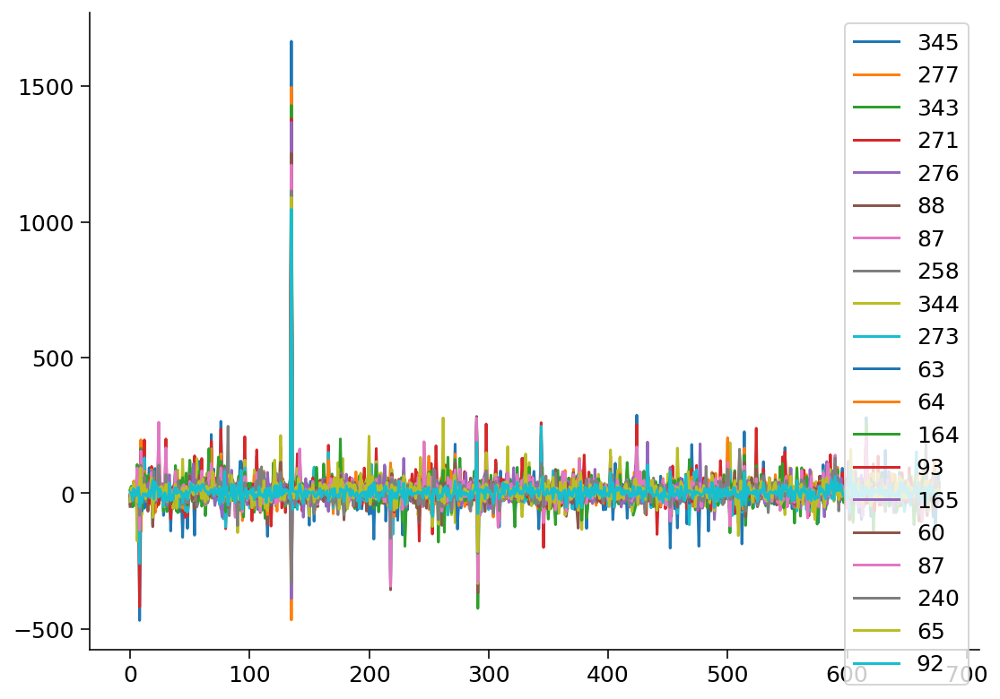

In [139]:
contrast[roi].plot()

         0          1          2    ...        357        358        359
0  63.963692  16.777333  35.398256  ...   1.378769  37.217026  40.757744
1   2.470536   1.973929  10.400893  ...  24.463036  22.522321   1.832857
2  24.088082   1.880533   8.407795  ...   6.509846  30.234769  17.628513
3   7.718143   0.989000   1.551250  ...  12.131250  11.725536  21.138750
4  44.221641   4.857344  28.388359  ...   3.148513  10.917744  10.728410

[5 rows x 360 columns]


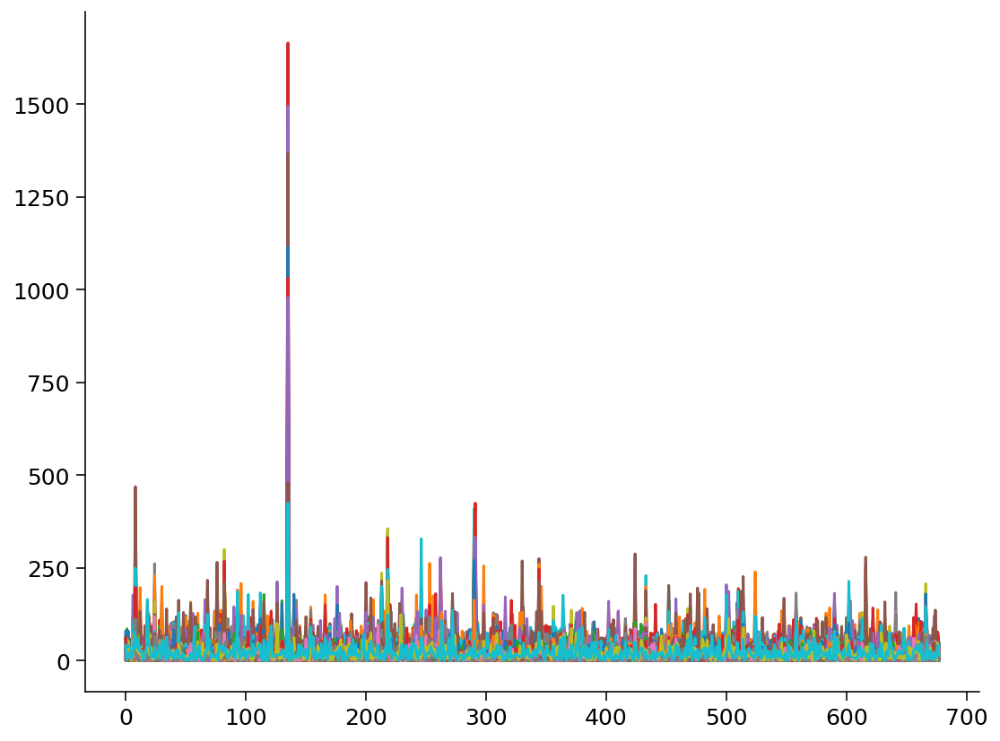

In [39]:
contrast_abs = abs(win_event_df - loss_event_df)
plt.plot(contrast_abs)
print(pd.DataFrame(contrast_abs).head())

In [40]:
contrast_abs.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359
count,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,...,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000
mean,16.889854,11.058566,12.538800,14.265479,13.115796,13.697832,17.305399,9.606136,11.017427,11.626012,14.209400,11.043660,12.416591,19.124101,14.815703,13.097585,12.457526,12.722125,13.741354,13.194223,14.338928,16.438131,10.671527,16.171914,10.228168,16.299817,13.249153,10.303926,15.310190,14.171218,17.776744,19.687547,21.475854,21.700069,20.048216,12.780731,12.100020,13.600579,10.783136,13.045064,...,10.933588,11.235117,10.504658,12.817168,13.752751,12.777602,10.590626,9.059006,10.379987,10.433688,10.647557,11.951680,19.899477,17.571396,19.816297,12.923700,10.900160,12.859229,11.248882,20.392018,17.714175,17.461962,14.569549,29.739769,35.136398,38.219369,17.049727,20.069793,18.507206,26.168122,20.870042,18.819281,15.199451,17.991852,10.114945,15.376938,13.746996,15.595361,20.332507,21.579208
std,13.868671,9.721842,11.682670,12.293105,11.847020,12.483149,17.048301,8.885794,9.485272,10.090440,12.523162,9.708940,11.552253,18.186196,12.823667,13.172626,12.162536,11.033293,11.935649,11.031148,13.554255,15.965639,9.963450,14.421914,9.042313,15.212032,12.141172,8.747604,16.347306,12.980739,15.794061,17.708252,21.284306,20.632066,17.395790,11.996142,11.319920,12.747657,10.780916,13.146620,...,12.357330,9.404212,9.257841,10.804917,11.525426,10.504305,10.557323,7.650153,8.950171,9.924022,9.344095,11.038279,19.243519,16.528503,19.342005,12.536059,9.493533,10.817893,11.819839,21.475949,14.324093,14.711335,12.300275,45.715058,49.671439,47.812632,16.111565,18.095764,17.221362,33.173359,20.736012,18.614902,14.301500,16.514567,8.931152,15.485512,13.465969,14.130717,18.625710,19.684976
min,0.071179,0.044103,0.015714,0.058393,0.083097,0.017231,0.025846,0.005579,0.002482,0.064369,0.085536,0.007000,0.037436,0.075000,0.009643,0.027571,0.006667,0.016810,0.030536,0.071661,0.053108,0.038500,0.024462,0.032103,0.042421,0.051429,0.009768,0.006857,0.003692,0.006205,0.026250,0.005436,0.018000,0.041231,0.055077,0.005641,0.001607,0.039282,0.005549,0.001641,...,0.002143,0.000841,0.018500,0.019897,0.058393,0.043429,0.002769,0.032804,0.018564,0.000196,0.001714,0.016964,0.005000,0.010051,0.047897,0.024349,0.000804,0.008000,0.073231,0.139077,0.031429,0.165231,0.015536,0.028328,0.062215,0.118018,0.016786,0.018393,0.023750,0.003929,0.003393,0.057464,0.008923,0.036589,0.017426,0.009538,0.013625,0.001429,0.027590,0.048571
25%,6.610930,4.032791,4.297641,5.609866,5.419643,5.113339,6.521696,3.167132,4.097164,4.149973,4.976513,3.843984,4.406550,6.784787,5.604716,4.857187,4.321362,4.583473,4.805647,5.284086,5.351206,5.867265,3.706901,6.161187,3.588246,5.681410,4.656779,3.992019,4.778996,4.892791,6.027821,7.137991,7.593269,7.912500,7.594688,4.466024,3.824867,4.559561,3.830636,4.548815,...,3.829098,4.310001,4.347054,4.717232,5.117006,5.275893,3.636803,3.334574,3.585814,4.145071,3.604966,4.003834,6.756607,6.060670,6.697769,4.51

## Contrast Thresold

   0    1    2    3    4    5    6    ...  353  354  355  356  357  358  359
0  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN
1  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN
2  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN
3  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN
4  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN

[5 rows x 360 columns]


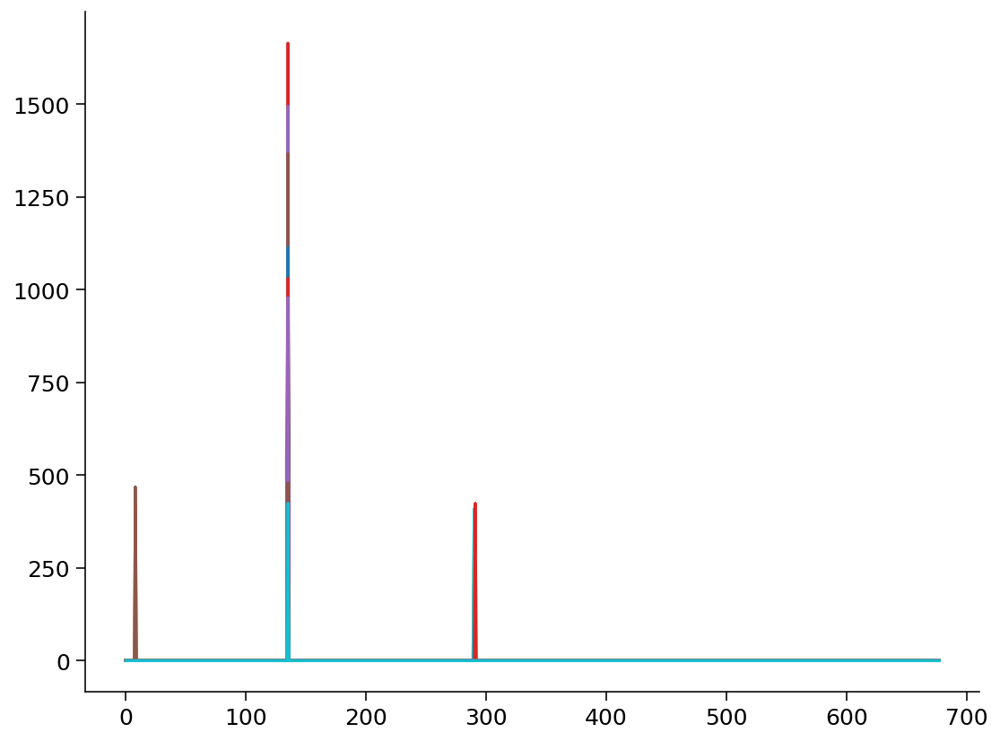

In [41]:
contrast_thre_rep = contrast_abs[contrast_abs>400]
plt.plot(contrast_thre_rep.fillna(0))
print(pd.DataFrame(contrast_thre_rep).head())

In [42]:
contrast_thre_rep 

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
673,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
674,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [43]:
#contrast_thre.to_csv("contrast_thre.csv")

In [44]:
contrast_thre_rep.dropna(how='all', axis=1, inplace=True)

In [45]:
contrast_thre_rep

,60,63,64,65,68,71,76,87,88,89,90,91,92,93,107,108,109,110,111,117,121,130,163,164,165,168,169,177,179,240,243,244,251,267,271,272,277,343,344,345,349
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
673,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
674,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [46]:
# contrast_thre.to_csv("contrast_thre_dropped.csv")

## Correlation contrast for hrf-mean


         0          1          2    ...        357        358        359
0 -63.963692 -16.777333 -35.398256  ...  -1.378769 -37.217026 -40.757744
1  -2.470536   1.973929  10.400893  ...  24.463036 -22.522321  -1.832857
2 -24.088082  -1.880533  -8.407795  ...  -6.509846 -30.234769 -17.628513
3   7.718143   0.989000   1.551250  ... -12.131250  11.725536 -21.138750
4 -44.221641  -4.857344 -28.388359  ...   3.148513 -10.917744  10.728410

[5 rows x 360 columns]


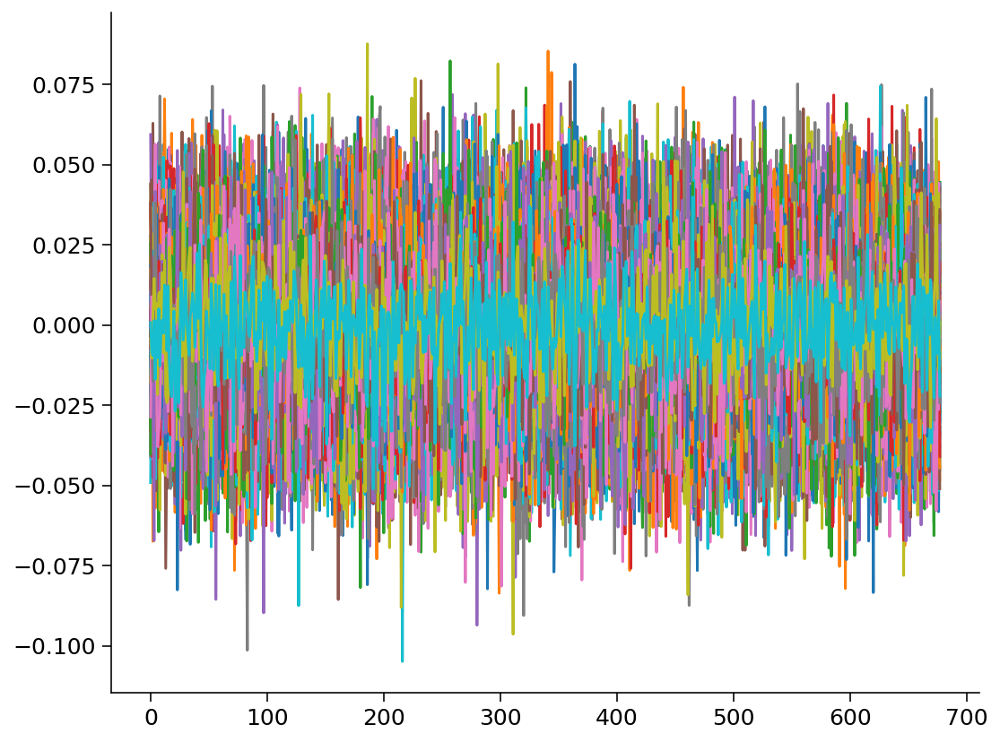

In [47]:
contrast_hrf = win_event_df_hrf - loss_event_df_hrf
plt.plot(contrast_hrf)
print(pd.DataFrame(contrast).head())

In [48]:
contrast_hrf.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359
count,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,...,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000
mean,-0.000729,-0.000119,-0.000974,-0.000471,-0.000971,-0.001896,-0.001455,-0.000484,-0.000295,-0.001604,-0.001020,-0.001542,-0.002444,-0.000090,-0.000963,-0.001129,-0.002214,-0.002086,-0.001293,-0.000418,-0.001888,-0.001674,0.000766,-0.000396,-0.001641,-0.000393,-0.001478,-0.001418,-0.001334,0.000959,-0.000553,-0.000211,-0.000451,-0.000563,0.000245,-0.000837,-0.001255,-0.001201,-0.000555,-0.000791,...,-0.000280,-0.000799,0.000222,-0.001681,-0.001066,-0.000708,-0.000984,-0.001469,0.000218,-0.000825,0.000506,-0.001045,0.000165,-0.000263,-0.000538,-0.000981,-0.001781,-0.001423,-0.001463,-0.000583,-0.000854,0.000205,-0.000292,-0.000392,-0.000646,-0.000601,-0.000556,0.000554,-0.000936,-0.000751,-0.001008,-0.000220,0.000652,-0.000714,-0.002208,-0.001381,-0.001039,-0.000427,0.000180,-0.001008
std,0.017318,0.017805,0.017451,0.017075,0.020118,0.017542,0.014887,0.022094,0.020755,0.018616,0.015318,0.018911,0.018469,0.013376,0.017189,0.017054,0.017014,0.017792,0.015785,0.016526,0.016403,0.015622,0.018199,0.015092,0.021111,0.015975,0.017376,0.019960,0.016962,0.017072,0.014321,0.013682,0.012557,0.011976,0.014344,0.017686,0.017262,0.017414,0.019344,0.016537,...,0.018542,0.018300,0.020387,0.018368,0.017563,0.016905,0.020342,0.022831,0.021843,0.018881,0.020395,0.018186,0.013183,0.013788,0.012861,0.016863,0.018011,0.017756,0.018709,0.012697,0.014456,0.014186,0.015485,0.010834,0.011558,0.011280,0.014156,0.013246,0.014520,0.015105,0.014611,0.015373,0.015412,0.013505,0.021407,0.017123,0.018195,0.014387,0.013773,0.012587
min,-0.060712,-0.076524,-0.062366,-0.067283,-0.078675,-0.049881,-0.048430,-0.071344,-0.059334,-0.069179,-0.062012,-0.067462,-0.070808,-0.036491,-0.058881,-0.056861,-0.053354,-0.060705,-0.050704,-0.054882,-0.055841,-0.056138,-0.054598,-0.057727,-0.093602,-0.058509,-0.067803,-0.060414,-0.052548,-0.058307,-0.051903,-0.052268,-0.038601,-0.044408,-0.047684,-0.052713,-0.064300,-0.051663,-0.066647,-0.057067,...,-0.053823,-0.063950,-0.069566,-0.065155,-0.054955,-0.048409,-0.080281,-0.071311,-0.084153,-0.052937,-0.083434,-0.054984,-0.054866,-0.045344,-0.043258,-0.053356,-0.059485,-0.045953,-0.057520,-0.039250,-0.044674,-0.057727,-0.046279,-0.037445,-0.053421,-0.043460,-0.049830,-0.058817,-0.049371,-0.048165,-0.044203,-0.054125,-0.041283,-0.045000,-0.089747,-0.054562,-0.067884,-0.045287,-0.043737,-0.042242
25%,-0.010623,-0.010657,-0.012518,-0.011405,-0.012274,-0.013082,-0.010818,-0.016924,-0.013992,-0.013865,-0.010056,-0.013803,-0.013859,-0.008594,-0.011763,-0.012230,-0.013601,-0.013064,-0.011521,-0.010606,-0.012223,-0.011040,-0.010651,-0.009485,-0.016053,-0.010381,-0.012247,-0.014492,-0.012956,-0.009991,-0.010092,-0.008603,-0.008867,-0.008005,-0.009552,-0.012157,-0.011816,-0.012131,-0.013648,-0.011566,...,-0.013342,-0.013110,-0.012411,-0.014054,-0.012039,-0.011256,-0.014334,-0.017311,-0.014793,-0.

        0         1         2    ...       357       358       359
0  0.003492  0.010102  0.014974  ...  0.005792  0.004298  0.000709
1  0.024855  0.002217  0.006507  ...  0.007288  0.010359  0.008468
2  0.010415  0.034942  0.025127  ...  0.017639  0.002739  0.009651
3  0.031004  0.006340  0.009349  ...  0.004706  0.014550  0.001318
4  0.013622  0.007331  0.005770  ...  0.038147  0.005060  0.016953

[5 rows x 360 columns]


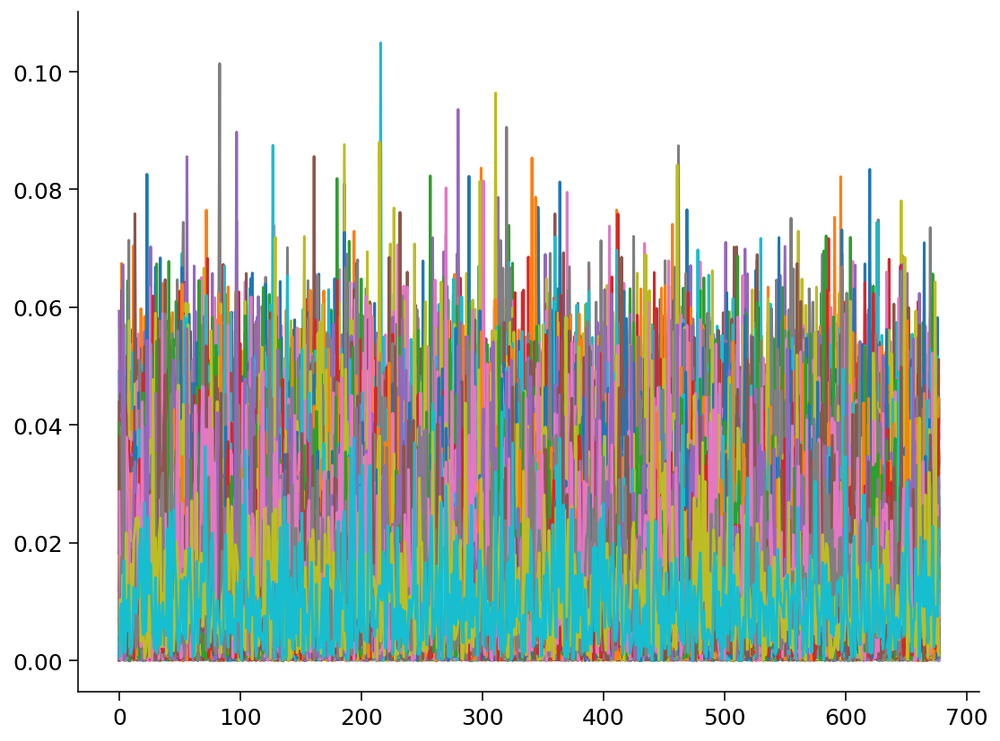

In [49]:
contrast_hrf_abs = abs(win_event_df_hrf - loss_event_df_hrf)
plt.plot(contrast_hrf_abs)
print(pd.DataFrame(contrast_hrf_abs).head())

In [50]:
contrast_hrf_abs.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359
count,678.000000,678.000000,678.000000,678.000000,6.780000e+02,678.000000,6.780000e+02,678.000000,6.780000e+02,678.000000,678.000000,678.000000,678.000000,678.000000,6.780000e+02,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,6.780000e+02,678.000000,678.000000,6.780000e+02,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,6.780000e+02,678.000000,678.000000,6.780000e+02,678.000000,6.780000e+02,678.000000,...,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,6.780000e+02,6.780000e+02,6.780000e+02,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,6.780000e+02,678.000000,678.000000,6.780000e+02,678.000000,678.000000,6.780000e+02,6.780000e+02,6.780000e+02,678.000000,678.000000,678.000000,6.780000e+02,678.000000,6.780000e+02,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000,678.000000
mean,0.013338,0.013701,0.013694,0.013387,1.540687e-02,0.014015,1.164693e-02,0.017927,1.654042e-02,0.014741,0.011873,0.015050,0.014326,0.010464,1.337052e-02,0.013478,0.013911,0.013837,0.012376,0.013045,0.012830,0.012137,1.431446e-02,0.011708,0.016417,1.253972e-02,0.013692,0.015652,0.013479,0.013307,0.011227,0.010640,0.009973,9.348094e-03,0.011192,0.013925,1.333274e-02,0.013628,1.506116e-02,0.013198,...,0.014808,0.014324,0.015694,0.014829,0.013785,0.013278,1.598375e-02,1.817169e-02,1.700559e-02,0.015189,0.016185,0.014374,0.010196,0.010639,0.009914,0.013113,0.014327,1.419445e-02,0.014782,0.010088,1.130411e-02,0.011271,0.012292,8.356414e-03,9.067457e-03,8.526655e-03,0.010996,0.010463,0.011480,1.200063e-02,0.011600,1.224946e-02,0.012214,0.010592,0.017114,0.013503,0.014238,0.011276,0.010942,0.009845
std,0.011058,0.011360,0.010848,0.010597,1.295949e-02,0.010707,9.375660e-03,0.012905,1.252539e-02,0.011467,0.009721,0.011539,0.011897,0.008323,1.083232e-02,0.010498,0.010029,0.011365,0.009872,0.010142,0.010381,0.009967,1.125115e-02,0.009521,0.013358,9.892623e-03,0.010787,0.012453,0.010369,0.010726,0.008897,0.008595,0.007634,7.498251e-03,0.008965,0.010922,1.102411e-02,0.010895,1.213736e-02,0.009982,...,0.011148,0.011403,0.013000,0.010955,0.010921,0.010474,1.260524e-02,1.388237e-02,1.369507e-02,0.011231,0.012404,0.011176,0.008348,0.008766,0.008201,0.010636,0.011046,1.074881e-02,0.011547,0.007723,9.041187e-03,0.008606,0.009410,6.899428e-03,7.187190e-03,7.401722e-03,0.008922,0.008133,0.008929,9.192471e-03,0.008930,9.278625e-03,0.009410,0.008398,0.013031,0.010606,0.011362,0.008935,0.008356,0.007899
min,0.000014,0.000025,0.000024,0.000032,9.693644e-07,0.000058,4.315203e-07,0.000022,8.712407e-07,0.000019,0.000002,0.000055,0.000024,0.000011,1.138322e-08,0.000083,0.000043,0.000038,0.000007,0.000057,0.000034,0.000033,7.458299e-22,0.000002,0.000121,3.108123e-90,0.000056,0.000032,0.000009,0.000145,0.000003,0.000026,0.000011,4.919938e-08,0.000002,0.000086,6.582652e-10,0.000098,6.617745e-24,0.000004,...,0.000005,0.000066,0.000009,0.000012,0.000012,0.000050,1.923119e-38,1.524035e-13,9.051943e-14,0.000055,0.000232,0.000034,0.000066,0.000009,0.000004,0.000013,0.000015,1.415168e-07,0.000015,0.000013,8.446222e-07,0.000043,0.000079,1.222321e-08,5.891375e-42,1.712352e-08,0.000002,0.000001,0.000053,4.761674e-14,0.000004,3.585217e-12,0.000046,0.000018,0.000027,0.000032,0.000004,0.000056,0.000010,0.000052
25%,0.004818,0.004990,0.005072,0.005276,5.774673e-03,0.005783,4.702636e-03,0.007592,6.777473e-03,0.006067,0.004158,0.005931,0.005126,0.003798,4.555596e-03,0.005151,0.006316,0.005084,0.004642,0.004766,0.004904,0.004387,5.322688e-03,0.004288,0.005855,5.063774e-03,0.005648,0.006076,0.005262,0.005034,0.004454,0.004400,0.003760,3.477196e-03,0.004102,0.005225,5.107039e-03,0.004954,5.2149

   0    1    2    3    4    5    6    ...  353  354  355  356  357  358  359
0  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN
1  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN
2  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN
3  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN
4  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN

[5 rows x 360 columns]


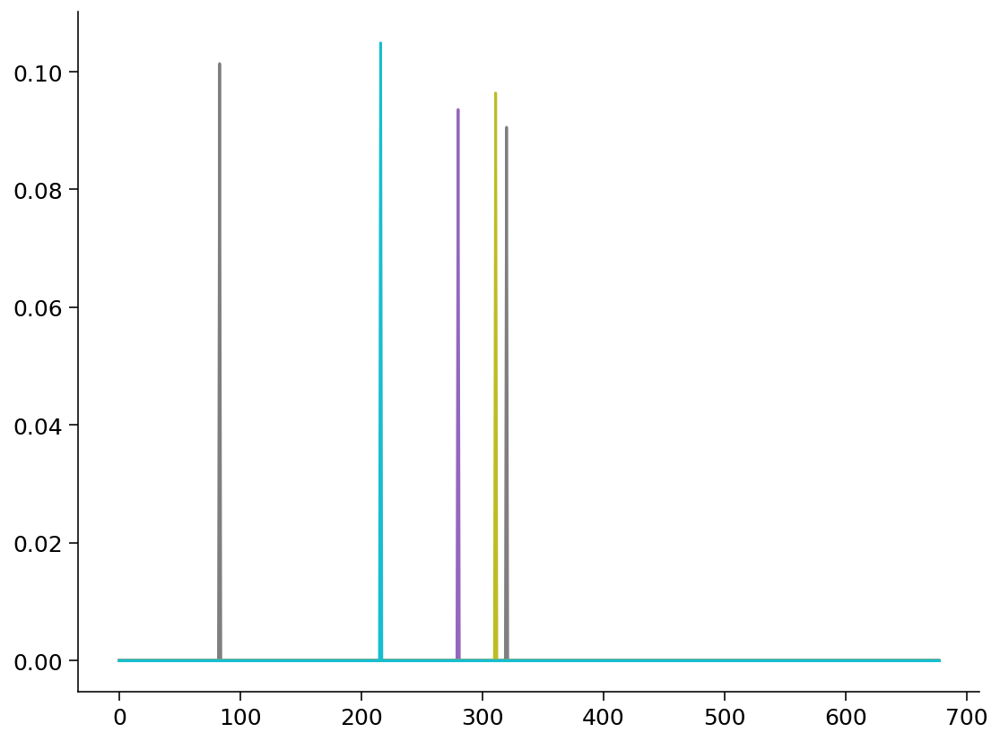

In [51]:
contrast_hrf_thre_rep = contrast_hrf_abs[contrast_hrf_abs>0.09]
plt.plot(contrast_hrf_thre_rep.fillna(0))

print(pd.DataFrame(contrast_hrf_thre_rep).head())

In [52]:
# contrast_hrf_thre_rep.dropna(how='all', axis=1, inplace=True)
# contrast_hrf_thre_rep.to_csv("contrast_hrf_thre_rep.csv")
# contrast_hrf_thre_rep.head()

   0    1    2    3    4    5    6    ...  353  354  355  356  357  358  359
0  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN
1  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN
2  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN
3  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN
4  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN

[5 rows x 360 columns]


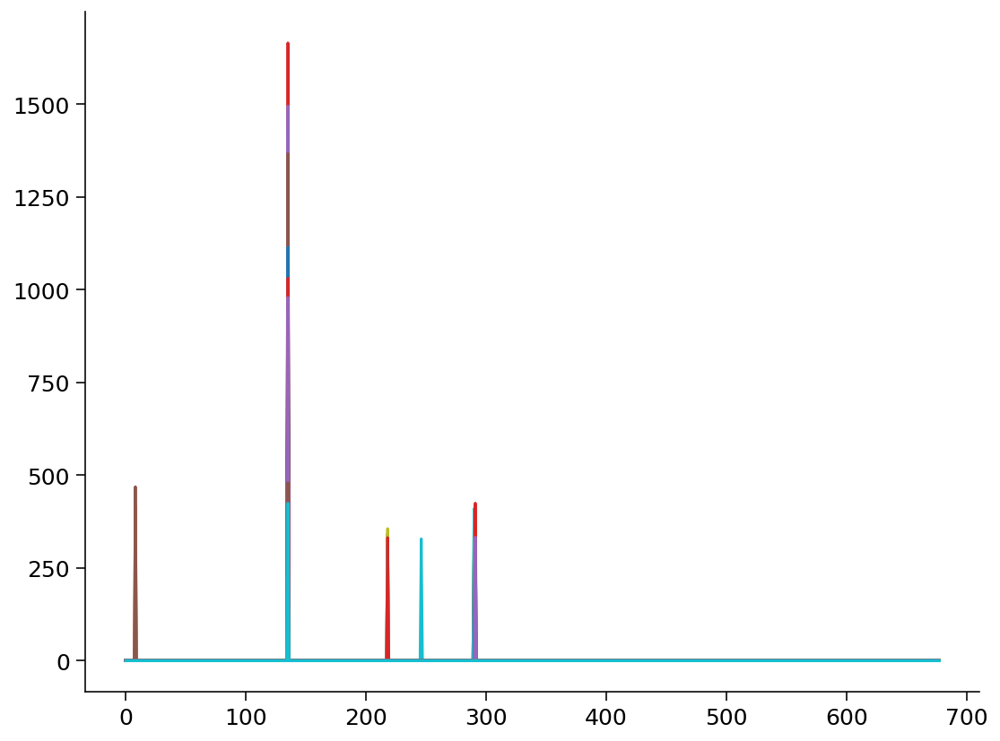

In [53]:
contrast_thre_rep = contrast_abs[contrast_abs>300]
plt.plot(contrast_thre_rep.fillna(0))
print(pd.DataFrame(contrast_thre_rep).head())

## Load a concatenated resting-state timeseries (using all runs' data) for each subject:

In [54]:
timeseries_rest = []
for subject in subjects: # we use 1 , 2 --> 2 frames for each
  ts_concat = load_timeseries(subject, "GAMBLING")
  timeseries_rest.append(ts_concat) #shape=(339, 360, 4800)

In [55]:
pd.DataFrame( timeseries_rest[0][0] ) # rep both runs for sub 0==> 253

,0
0,11.539921
1,13.939921
2,-34.260079
3,-77.660079
4,-192.660079
...,...
501,-112.771937
502,-138.171937
503,-157.471937
504,-180.271937


In [56]:
# avg for first run
pd.DataFrame( [timeseries_rest[i][0] for i in subjects] ).iloc[:,:253].mean(axis=1)

0      2.013111e-13
1     -1.437936e-14
2      5.392261e-13
3     -3.954325e-13
4      8.124340e-13
           ...     
334   -8.915205e-13
335    1.092832e-12
336   -7.261578e-13
337   -5.392261e-13
338   -2.875873e-13
Length: 339, dtype: float64

In [57]:
# avg for sec run
pd.DataFrame( [timeseries_rest[i][0] for i in subjects] ).iloc[:,253:].mean(axis=1)

0      7.189681e-13
1     -1.775851e-12
2      9.346586e-14
3      1.531402e-12
4     -9.706070e-13
           ...     
334   -3.738634e-13
335   -1.409178e-12
336    5.320364e-13
337   -1.308522e-12
338    4.313809e-13
Length: 339, dtype: float64

In [58]:
pd.DataFrame( timeseries_rest[1] )

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505
0,-0.713123,-9.253123,-3.033123,-41.563123,-57.553123,-39.863123,-57.413123,-51.143123,-46.443123,-86.603123,-118.483123,-70.033123,-68.143123,-55.393123,-28.293123,-29.873123,-14.533123,-0.843123,-6.833123,15.176877,7.286877,-3.903123,12.556877,-28.633123,3.596877,24.186877,20.596877,17.366877,35.936877,27.366877,18.316877,49.916877,1.076877,8.086877,-19.193123,22.016877,2.156877,-32.873123,0.766877,32.516877,...,22.045257,19.225257,-12.934743,26.785257,7.575257,-22.704743,-7.114743,-2.494743,2.795257,-22.134743,-2.784743,0.255257,-14.984743,14.125257,5.655257,-0.814743,-7.044743,4.735257,-1.214743,46.155257,9.525257,-9.974743,-3.114743,-1.694743,-11.644743,-15.624743,-51.164743,-56.254743,-79.434743,-59.404743,-39.244743,-15.514743,-2.834743,10.515257,31.395257,38.535257,11.735257,15.105257,-9.014743,0.945257
1,15.853241,-37.436759,-6.606759,-50.636759,-9.566759,54.863241,33.713241,-21.916759,42.753241,-5.716759,-24.406759,24.003241,11.723241,16.643241,14.243241,65.443241,48.503241,40.973241,26.743241,37.793241,18.593241,41.553241,54.513241,5.003241,48.933241,39.903241,58.293241,53.663241,33.153241,37.063241,18.383241,-27.396759,-1.906759,-13.146759,-39.216759,-17.636759,18.653241,-16.496759,20.223241,-41.796759,...,-1.685692,34.664308,4.154308,57.084308,-14.505692,5.364308,-9.295692,7.744308,-11.035692,-10.925692,-9.345692,6.104308,-3.485692,-27.115692,-14.605692,-3.405692,1.014308,22.844308,36.464308,44.094308,-15.455692,-27.235692,-7.715692,31.864308,18.154308,-3.375692,-24.775692,-4.045692,-42.125692,13.114308,1.674308,-13.645692,42.764308,90.464308,45.174308,85.214308,66.664308,20.594308,-64.305692,8.684308
2,-13.703162,30.596838,-43.503162,53.296838,-16.703162,43.096838,30.296838,-36.803162,-17.003162,3.596838,5.096838,0.396838,12.196838,63.096838,137.896838,112.296838,108.496838,96.696838,112.596838,49.996838,26.696838,4.996838,50.496838,-6.003162,-7.403162,63.496838,16.396838,-1.003162,21.096838,27.096838,-25.003162,-3.503162,-23.103162,35.596838,1.496838,-18.103162,23.696838,-13.503162,10.396838,14.296838,...,-8.723320,-10.623320,-17.723320,6.076680,13.176680,-40.723320,-38.423320,33.776680,5.476680,5.476680,-2.623320,14.776680,-16.923320,-47.623320,1.276680,-30.623320,22.176680,-21.023320,-35.423320,-28.623320,-80.523320,-87.523320,-85.623320,4.676680,-39.123320,-47.923320,-35.723320,-42.323320,-24.923320,-9.723320,10.976680,5.776680,44.576680,-5.223320,-3.123320,58.676680,57.676680,10.876680,7.476680,-9.423320
3,-1.009960,-16.789960,-15.509960,-46.429960,-32.719960,-40.949960,-81.599960,-94.499960,-80.869960,-94.689960,-127.639960,-69.849960,-62.539960,-32.339960,14.890040,-2.729960,21.230040,-3.299960,-4.969960,-18.939960,-5.839960,6.250040,-22.679960,-12.959960,28.120040,44.590040,36.620040,28.030040,63.810040,62.590040,22.820040,55.950040,21.570040,-10.459960,-4.659960,8.180040,-38.029960,-43.259960,4.950040,-8.119960,...,5.796877,7.506877,-5.103123,-28.953123,5.756877,-22.543123,-7.523123,-48.903123,-30.573123,-43.753123,-14.873123,-12.853123,-43.823123,2.376877,-10.133123,5.166877,-36.253123,-12.563123,-26.033123,11.716877,-27.113123,-23.123123,-11.423123,-23.173123,-11.993123,-48.393123,-69.293123,-57.233123,-43.493123,-71.573123,-39.793123,-42.013123,-6.633123,31.166877,29.016877,49.346877,3.406877,7.596877,23.376877,-14.483123
4,12.301462,13.311462,2.561462,-11.438538,-32.458538,-8.848538,-28.788538,-30.798538,-77.548538,-70.618538,-86.938538,-64.328538,-53.008538,-10.438538,-2.158538,12.161462,0.371462,-22.018538,0.701462,-15.888538,-16.188538,-21.368538,-14.718538,-15.618538,-12.038538,16.131462,-4.818538,17.941462,4.921462,2.731462,18.611462,-9.178538,-4.118538,-6.948538,-6.058538,-1.608538,-16.358538,-23.258538,-2.688538,13.371462,.

0     11.539921
1     13.939921
2    -34.260079
3    -77.660079
4   -192.660079
Name: 0, dtype: float64


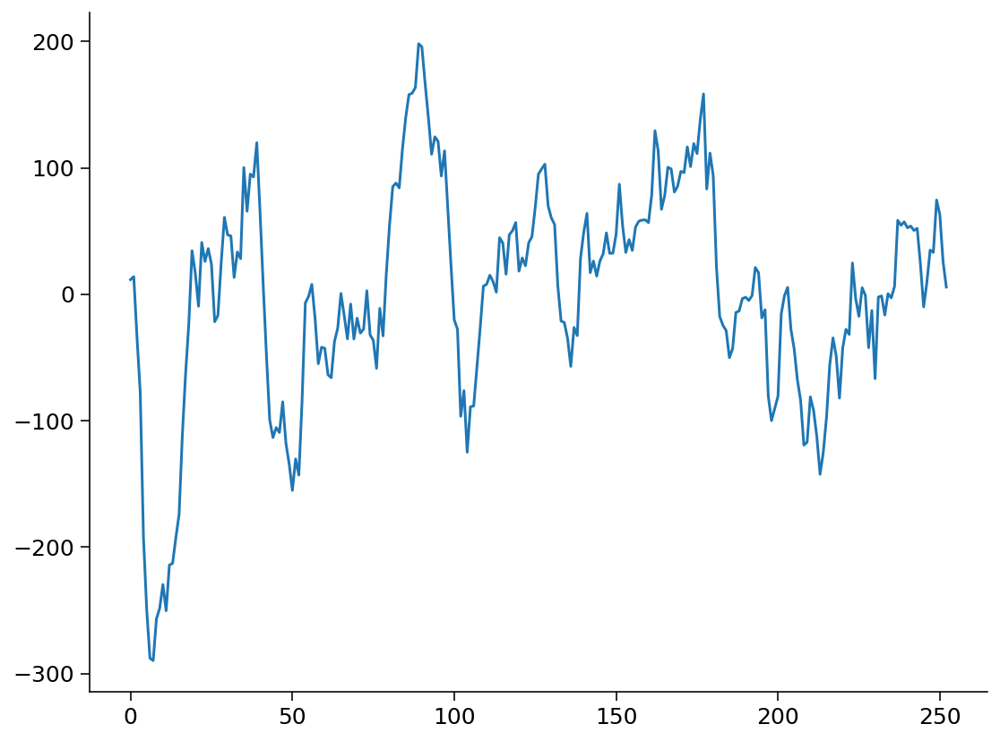

In [59]:
# for parcel 0 for run 1
par_1=pd.DataFrame( [timeseries_rest[i][0] for i in subjects] ).iloc[0,:253]
print(par_1.head())
plt.plot(par_1 )

## Run a simple correlation-based "functional connectivity" analysis

Generate a correlation matrix (showing "functional connectivity" or FC) for each subject and plot the group average:

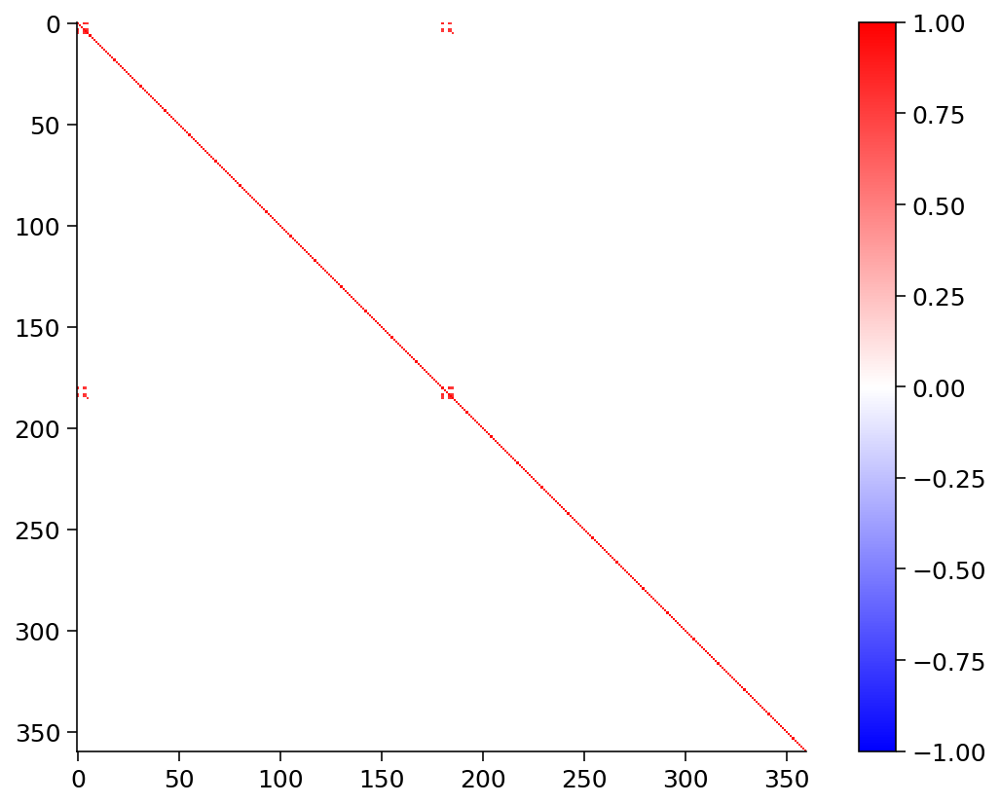

In [60]:
fc = np.zeros((N_SUBJECTS, N_PARCELS, N_PARCELS))
for sub, ts in enumerate(timeseries_rest):
  fc[sub] = np.corrcoef(ts)

group_fc = fc.mean(axis=0)
cor_df=pd.DataFrame( group_fc )

plt.imshow( cor_df[cor_df>0.75] , interpolation="none", cmap="bwr", vmin=-1, vmax=1)
plt.colorbar()
plt.show()

Plot the profile of FC values between a particular "seed" parcel and every parcel in the dataset, separated by hemisphere:

In [61]:
cor_df.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359
count,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,...,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000
mean,0.289990,0.231857,0.260808,0.290749,0.296937,0.271906,0.218402,0.272073,0.250941,0.278436,0.234145,0.262678,0.278296,0.175743,0.268077,0.243518,0.264113,0.253100,0.245750,0.225637,0.197862,0.226624,0.217492,0.186275,0.266381,0.233758,0.251636,0.259955,0.231696,0.215775,0.183325,0.188246,0.123776,0.146810,0.171933,0.203898,0.226944,0.246204,0.218832,0.212399,...,0.244068,0.252266,0.278742,0.265814,0.266765,0.255446,0.242446,0.291012,0.289341,0.227241,0.230502,0.230759,0.162962,0.185486,0.111033,0.203868,0.233248,0.248020,0.235447,0.153039,0.174075,0.169257,0.222240,0.066220,0.101093,0.076561,0.164458,0.129901,0.233628,0.226430,0.239152,0.156844,0.174748,0.186828,0.207580,0.157196,0.150679,0.145382,0.245346,0.199372
std,0.173632,0.125550,0.094910,0.169927,0.168606,0.187920,0.163653,0.104725,0.107797,0.152020,0.153131,0.103117,0.142452,0.065443,0.104718,0.122713,0.142272,0.158538,0.156440,0.161289,0.161486,0.164762,0.104869,0.075616,0.121755,0.088088,0.096161,0.107087,0.131737,0.086107,0.083821,0.066031,0.090624,0.068019,0.090958,0.083484,0.089821,0.085852,0.093851,0.085632,...,0.108898,0.086471,0.109848,0.139874,0.127352,0.168896,0.114165,0.119376,0.118625,0.126177,0.135482,0.085574,0.070911,0.110089,0.066019,0.150135,0.146154,0.160528,0.130163,0.073283,0.107928,0.088686,0.135381,0.062821,0.080362,0.069413,0.077040,0.065005,0.092476,0.100963,0.105736,0.074634,0.074060,0.074340,0.092506,0.115261,0.087105,0.065954,0.084947,0.072238
min,-0.003455,0.020850,0.064478,0.015213,0.028386,-0.014074,-0.045024,0.074276,0.044117,-0.008167,-0.044267,0.051364,0.051766,0.028312,0.051706,0.053400,0.041357,-0.005816,0.010364,-0.022523,-0.047379,-0.030732,0.042368,0.021260,0.024611,0.031429,0.042597,0.058194,-0.002146,0.061690,0.049929,0.043994,-0.030610,0.039668,0.027260,0.057382,0.048023,0.059360,0.063718,0.037886,...,0.038224,0.072546,0.063320,0.010082,0.040574,-0.012733,0.021684,0.045580,0.071034,-0.000936,-0.026326,0.059874,0.039050,0.019842,0.011291,-0.007569,0.002136,0.021706,0.022470,0.023829,-0.012003,0.006674,0.015835,-0.006309,-0.027284,-0.041884,0.032521,0.025124,0.044544,0.058048,0.064361,0.039128,0.043092,0.039809,0.033805,-0.066522,0.016116,0.032499,0.053622,0.074412
25%,0.149124,0.132860,0.197407,0.154262,0.164025,0.127176,0.094730,0.205728,0.180354,0.155329,0.110743,0.181991,0.162414,0.143884,0.186237,0.147180,0.147899,0.126736,0.120882,0.102763,0.077831,0.099548,0.141397,0.147557,0.173323,0.179466,0.179246,0.182737,0.119014,0.156743,0.130108,0.150956,0.068796,0.110434,0.115570,0.151668,0.168846,0.187454,0.157999,0.161542,...,0.159431,0.198804,0.199484,0.153066,0.162166,0.113280,0.164250,0.210303,0.200719,0.133197,0.130370,0.176808,0.120724,0.103330,0.076020,0.086115,0.118338,0.119152,0.132355,0.109508,0.100374,0.107723,0.115603,0.036886,0.054528,0.041514,0.116210,0.094798,0.166296,0

In [62]:
region_info.keys()

dict_keys(['name', 'network', 'myelin'])

In [63]:
region_df= pd.DataFrame( region_info )
region_df.head() # 360 x names of each reagion

,name,network,myelin
0,R_V1,Visual1,2.20900
1,R_MST,Visual2,2.05561
2,R_V6,Visual2,2.14980
3,R_V2,Visual2,2.15347
4,R_V3,Visual2,2.07251


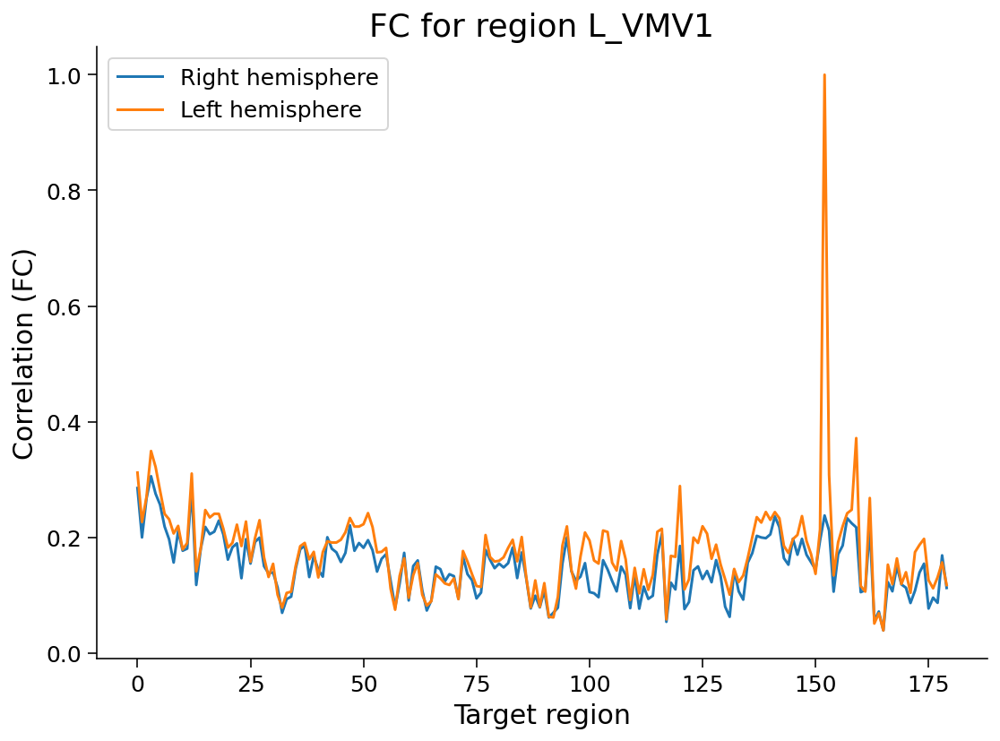

In [64]:
seed_roi = "L_VMV1"  # name of seed parcel
ind = region_info["name"].index(seed_roi)

hemi_fc = np.split(group_fc, 2)

# Plot the FC profile across the right and left hemisphere target regions
for i, hemi_fc in enumerate(hemi_fc):
  plt.plot( hemi_fc[:, ind] , label=f"{HEMIS[i]} hemisphere" )
plt.title(f"FC for region {seed_roi}")
plt.xlabel("Target region")
plt.ylabel("Correlation (FC)")
plt.legend()
plt.show()

Threshold the correlation matrix to produce a connectome, and plot it:

In [65]:
plotting.view_connectome(group_fc, atlas["coords"], edge_threshold="99%")

# Task analyses

Description of each task, task timing, and conditions is located [here](https://protocols.humanconnectome.org/HCP/3T/task-fMRI-protocol-details.html).

These are the condition names for each task:

```
- MOTOR: cue, lf, lh, rf, rh, t
- WM:
    0bk_body, 0bk_faces, 0bk_nir, 0bk_placed, 0bk_tools, 
    2bk_body, 2bk_faces, 2bk_nir, 2bk_placed, 2bk_tools,
    0bk_cor, 0bk_err,
    2bk_cor, 2bk_err,
    all_bk_cor, all_bk_err
- EMOTION: feat, neutral
- GAMBLING: loss, loss_event, win, win_event, neut_event
- LANGUAGE:
    cue,
    math, story
    present_math, present_story,
    question_math, question_story,
    response_math, response_story
- RELATIONAL: error, match, relation
- SOCIAL: mental_resp, mental, other_resp, rnd
```

## Load individual runs for a given task

Load each subject's data for a specific task, separately for each run:

In [66]:
timeseries_task = []
for subject in subjects:
  timeseries_task.append(load_timeseries(subject, "gambling", concat=False ))

In [67]:
#print(len(timeseries_task[0][0][0]))
#print(timeseries_task[0][0])
#print(timeseries_task[0][0])

#pd.DataFrame( timeseries_task[0] )
len( timeseries_task[0] )

2

## Run a simple subtraction analysis

In [68]:
help(load_evs)

Help on function load_evs in module __main__:

load_evs(subject, name, condition)
    Load EV (explanatory variable) data for one task condition.
    
    Args:
      subject (int): 0-based subject ID to load
      name (str) : Name of task
      condition (str) : Name of condition
    
    Returns
      evs (list of dicts): A dictionary with the onset, duration, and amplitude
        of the condition for each run.



In [69]:
help(selective_average)

Help on function selective_average in module __main__:

selective_average(timeseries_data, ev, skip=0)
    Take the temporal mean across frames for a given condition.
    
    Args:
      timeseries_data (array or list of arrays): n_parcel x n_tp arrays
      ev (dict or list of dicts): Condition timing information
      skip (int) : Ignore this many frames at the start of each trial, to account
        for hemodynamic lag
    
    Returns:
      avg_data (1D array): Data averagted across selected image frames based
      on condition timing



In [70]:
task = "gambling"
#conditions = ["loss", "win"]  # Run a substraction analysis between two conditions
#conditions = ['loss_event','win_event']
conditions = ['win_event','loss_event']
contrast = []
for subject in subjects:

  # Get the average signal in each region for each condition
  evs = [ load_evs(subject, task, cond) for cond in conditions ]
  avgs = [selective_average(timeseries_task[subject], ev) for ev in evs]

  # Store the region-wise difference
  contrast.append(avgs[0] - avgs[1])

group_contrast = np.mean(contrast, axis=0)

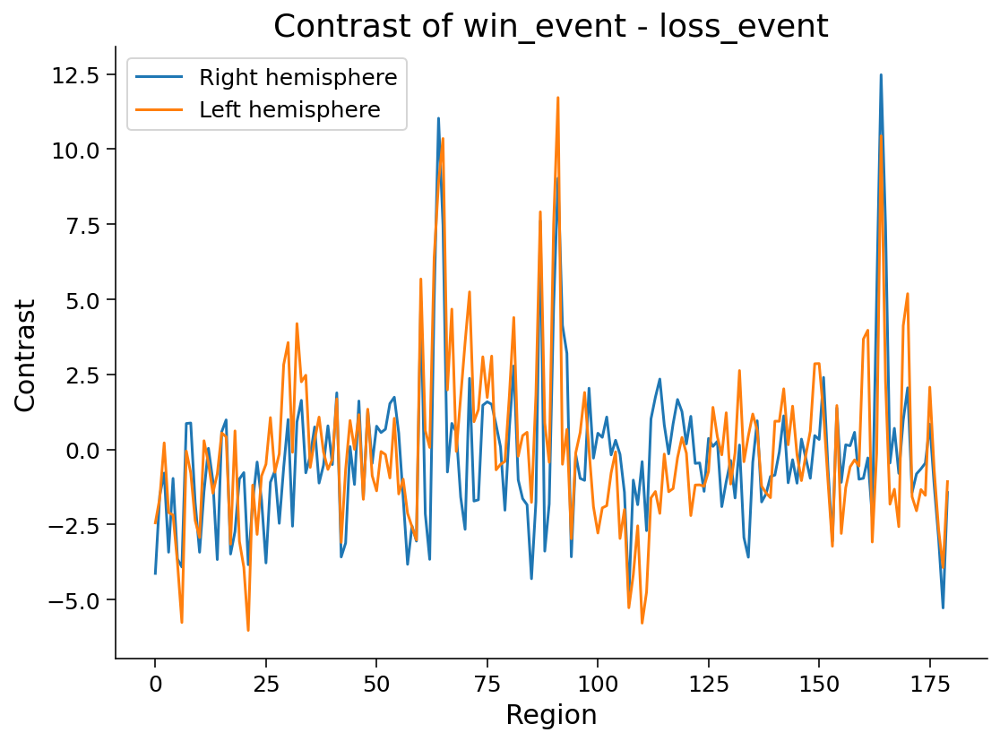

In [71]:
hemi_contrasts = np.split(group_contrast, 2)

for i, hemi_contrast in enumerate(hemi_contrasts):
  plt.plot(hemi_contrast, label=f"{HEMIS[i]} hemisphere")

plt.title("Contrast of %s - %s" % (conditions[0], conditions[1]))
plt.xlabel("Region")
plt.ylabel('Contrast')
plt.legend()
plt.show()

In [72]:
help( load_evs)

Help on function load_evs in module __main__:

load_evs(subject, name, condition)
    Load EV (explanatory variable) data for one task condition.
    
    Args:
      subject (int): 0-based subject ID to load
      name (str) : Name of task
      condition (str) : Name of condition
    
    Returns
      evs (list of dicts): A dictionary with the onset, duration, and amplitude
        of the condition for each run.



In [73]:
help( selective_average )

Help on function selective_average in module __main__:

selective_average(timeseries_data, ev, skip=0)
    Take the temporal mean across frames for a given condition.
    
    Args:
      timeseries_data (array or list of arrays): n_parcel x n_tp arrays
      ev (dict or list of dicts): Condition timing information
      skip (int) : Ignore this many frames at the start of each trial, to account
        for hemodynamic lag
    
    Returns:
      avg_data (1D array): Data averagted across selected image frames based
      on condition timing



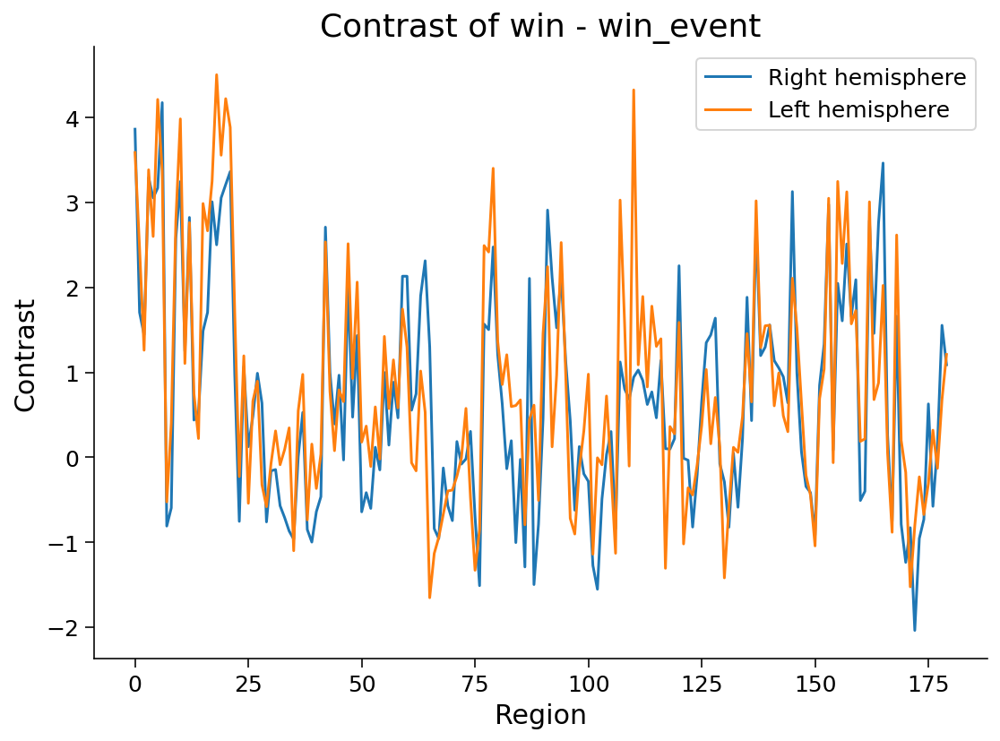

In [74]:
task = "gambling"
#conditions = ["loss", "win"]  # Run a substraction analysis between two conditions
conditions = ['win','win_event']
#conditions = ['loss','loss_event']
contrast = []
for subject in subjects:

  # Get the average signal in each region for each condition
  evs = [ load_evs(subject, task, cond) for cond in conditions ]
  avgs = [selective_average(timeseries_task[subject], ev) for ev in evs]

  # Store the region-wise difference
  contrast.append(avgs[0] - avgs[1])

group_contrast = np.mean(contrast, axis=0)
hemi_contrasts = np.split(group_contrast, 2)

for i, hemi_contrast in enumerate(hemi_contrasts):
  plt.plot(hemi_contrast, label=f"{HEMIS[i]} hemisphere")

plt.title("Contrast of %s - %s" % (conditions[0], conditions[1]))
plt.xlabel("Region")
plt.ylabel('Contrast')
plt.legend()
plt.show()

In [75]:
task = "gambling"
#conditions = ["win"]  # Run a substraction analysis between two conditions

win_condition = []
evs={}
for subject in subjects:

  # Get the average signal in each region for each condition
 evs[subject] = load_evs(subject, task, "win") 
  #avgs = [selective_average( timeseries_task[subject] , ev) for ev in evs]

  # Store the region-wise difference
  #contrast.append(avgs[0] - avgs[1])

#win_contrast = np.mean(avgs, axis=0)
#evs

In [76]:
task = "gambling"
sub_0_win={}
subjects= range(339)
for subject in subjects:
    sub_0_win[subject]= load_evs(subject, task, "win")

In [77]:
#np.array([evs[i][0]['amplitude'] for i in subjects] )

In [78]:
sub_0_win[0]

[{'amplitude': array([1., 1.]),
  'duration': array([28., 28.]),
  'onset': array([  8.063, 139.663])},
 {'amplitude': array([1., 1.]),
  'duration': array([28., 28.]),
  'onset': array([ 51.939, 139.677])}]

In [79]:
pd.DataFrame(evs)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338
0,"{'onset': [8.063, 139.663], 'duration': [28.0,...","{'onset': [8.076, 139.637], 'duration': [28.0,...","{'onset': [8.063, 139.649], 'duration': [28.0,...","{'onset': [8.063, 139.678], 'duration': [28.0,...","{'onset': [8.063, 139.703], 'duration': [28.0,...","{'onset': [8.063, 139.757], 'duration': [28.0,...","{'onset': [8.063, 139.702], 'duration': [28.0,...","{'onset': [8.076, 139.755], 'duration': [28.0,...","{'onset': [8.063, 139.689], 'duration': [28.0,...","{'onset': [8.077, 139.584], 'duration': [28.0,...","{'onset': [8.063, 139.677], 'duration': [28.0,...","{'onset': [8.103, 139.783], 'duration': [28.0,...","{'onset': [8.063, 139.768], 'duration': [28.0,...","{'onset': [8.09, 139.649], 'duration': [28.0, ...","{'onset': [8.064, 139.729], 'duration': [28.0,...","{'onset': [8.064, 139.679], 'duration': [28.0,...","{'onset': [8.063, 139.675], 'duration': [28.0,...","{'onset': [8.063, 139.677], 'duration': [28.0,...","{'onset': [8.063, 139.702], 'duration': [28.0,...","{'onset': [8.09, 139.728], 'duration': [28.0, ...","{'onset': [8.063, 139.741], 'duration': [28.0,...","{'onset': [8.064, 139.704], 'duration': [28.0,...","{'onset': [8.09, 139.744], 'duration': [28.0, ...","{'onset': [8.063, 139.649], 'duration': [28.0,...","{'onset': [8.076, 139.743], 'duration': [28.0,...","{'onset': [8.064, 139.636], 'duration': [28.0,...","{'onset': [8.063, 139.662], 'duration': [28.0,...","{'onset': [8.063, 139.649], 'duration': [28.0,...","{'onset': [8.063, 139.69], 'duration': [28.0, ...","{'onset': [8.063, 139.69], 'duration': [28.0, ...","{'onset': [8.077, 139.729], 'duration': [28.0,...","{'onset': [8.063, 139.691], 'duration': [28.0,...","{'onset': [8.064, 139.756], 'duration': [28.0,...","{'onset': [8.063, 139.73], 'duration': [28.0, ...","{'onset': [8.063, 139.703], 'duration': [28.0,...","{'onset': [8.063, 139.716], 'duration': [28.0,...","{'onset': [8.064, 139.689], 'duration': [28.0,...","{'onset': [8.063, 139.743], 'duration': [28.0,...","{'onset': [8.063, 139.729], 'duration': [28.0,...","{'onset': [8.064, 139.716], 'duration': [28.0,...",...,"{'onset': [8.063, 139.675], 'duration': [28.0,...","{'onset': [8.063, 139.689], 'duration': [28.0,...","{'onset': [8.063, 139.677], 'duration': [28.0,...","{'onset': [8.076, 139.716], 'duration': [28.0,...","{'onset': [8.064, 139.675], 'duration': [28.0,...","{'onset': [8.063, 139.688], 'duration': [28.0,...","{'onset': [8.077, 139.73], 'duration': [28.0, ...","{'onset': [8.076, 139.756], 'duration': [28.0,...","{'onset': [8.063, 139.731], 'duration': [28.0,...","{'onset': [8.063, 139.663], 'duration': [28.0,...","{'onset': [8.064, 139.69], 'duration': [28.0, ...","{'onset': [8.103, 139.783], 'duration': [28.0,...","{'onset': [8.063, 139.741], 'duration': [28.0,...","{'onset': [8.09, 139.743], 'duration': [28.0, ...","{'onset': [8.063, 139.689], 'duration': [28.0,...","{'onset': [8.063, 139.702], 'duration': [28.0,...","{'onset': [8.063, 139.688], 'duration': [28.0,...","{'onset': [8.09, 139.689], 'duration': [28.0, ...","{'onset': [8.077, 139.677], 'duration': [28.0,...","{'onset': [8.063, 139.716], 'duration': [28.0,...","{'onset': [8.077, 139.677], 'duration': [28.0,...","{'onset': [8.063, 139.704], 'duration': [28.0,...","{'onset': [8.064, 139.691], 'duration': [28.0,...","{'onset': [8.09, 139.769], 'duration': [28.0, ...","{'onset': [8.063, 139.756], 'duration': [28.0,...","{'onset': [8.077, 139.716], 'duration': [28.0,...","{'onset': [8.09, 139.73], 'duration': [28.0, 2...","{'onset': [8.077, 139.678], 'duration': [28.0,...","{'onset': [8.076, 139.768], 'duration': [28.0,...","{'onset': [8.063, 139.677], 'duration': [28.0,...","{'onset': [8.064, 139.715], 'duration': [28.0,...","{'onset': [8.063, 139.715]

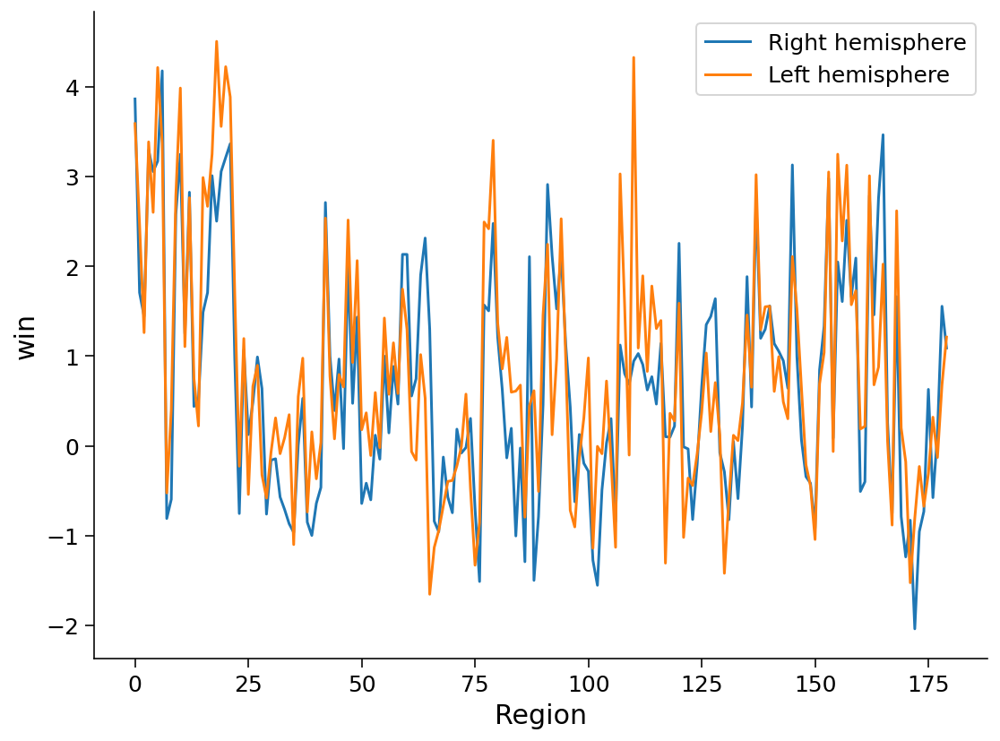

In [80]:
hemi_contrasts = np.split(group_contrast, 2)

for i, hemi_contrast in enumerate(hemi_contrasts):
  plt.plot(hemi_contrast, label=f"{HEMIS[i]} hemisphere")

#plt.title("Win of %s - %s" % (conditions[0], conditions[1]))
plt.xlabel("Region")
plt.ylabel('win')
plt.legend()
plt.show()

In [81]:
task = "gambling"
#conditions = ["win"]  # Run a substraction analysis between two conditions

win_condition = []

for subject in subjects:

  # Get the average signal in each region for each condition
 evs[subject] = load_evs(subject, task, "loss") 

In [82]:
def parcels_activity( task = "gambling",
                                condition = ['win'],
                                subject=1 ):

    # Get the average signal in each region for each condition
    evs = [ load_evs(subject, task, cond) for cond in conditions ]
    avgs = [selective_average(timeseries_task[subject], ev) for ev in evs]
    return np.array( avgs )[0]


In [83]:
def plot_subject(subject=0):
    fig, (ax0 , ax1) = plt.subplots (1 ,2)
    ax0.plot( parcels_activity( condition='loss_event' , subject=subject) -parcels_activity( condition='loss_event' , subject=subject).mean() )
    ax1.plot( parcels_activity( condition='win_event' , subject=subject) -parcels_activity( condition='win_event' , subject=subject).mean() )

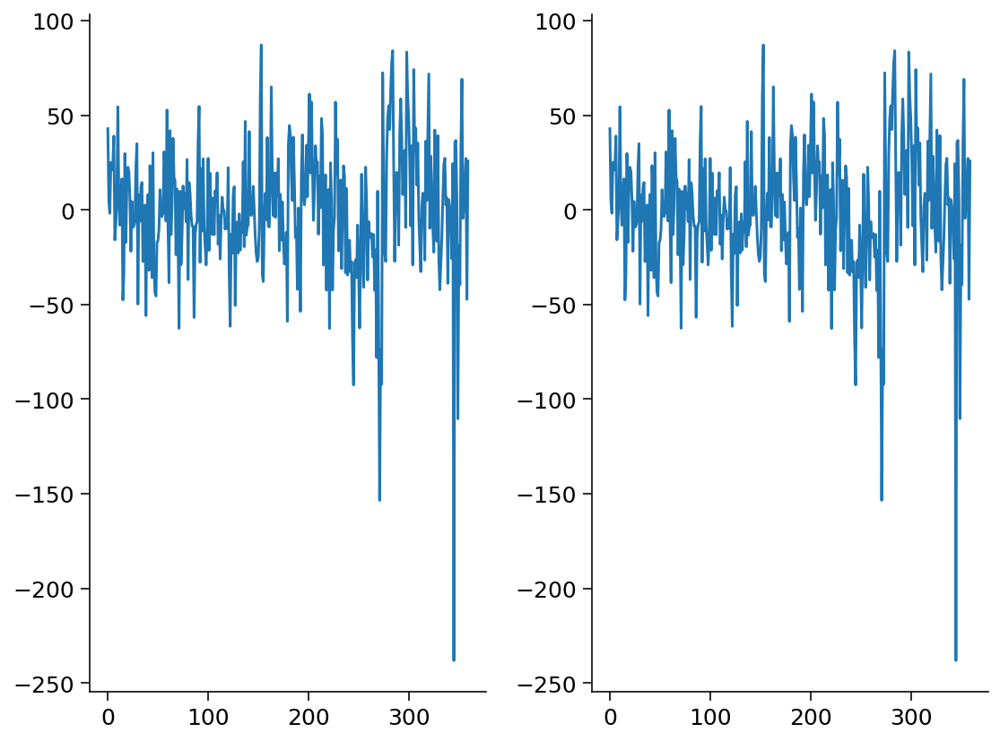

In [84]:
plot_subject(4)

In [85]:
pd.DataFrame(evs)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338
0,"{'onset': [51.939, 95.801], 'duration': [28.0,...","{'onset': [51.925, 95.788], 'duration': [28.0,...","{'onset': [51.899, 95.787], 'duration': [28.0,...","{'onset': [51.966, 95.828], 'duration': [28.0,...","{'onset': [51.912, 95.801], 'duration': [28.0,...","{'onset': [51.979, 95.881], 'duration': [28.0,...","{'onset': [51.978, 95.84], 'duration': [28.0, ...","{'onset': [51.978, 95.88], 'duration': [28.0, ...","{'onset': [51.925, 95.8], 'duration': [28.0, 2...","{'onset': [51.926, 95.748], 'duration': [28.0,...","{'onset': [51.966, 95.815], 'duration': [28.0,...","{'onset': [51.979, 95.881], 'duration': [28.0,...","{'onset': [51.965, 95.907], 'duration': [28.0,...","{'onset': [51.965, 95.787], 'duration': [28.0,...","{'onset': [51.939, 95.814], 'duration': [28.0,...","{'onset': [51.94, 95.789], 'duration': [28.0, ...","{'onset': [51.952, 95.84], 'duration': [28.0, ...","{'onset': [51.939, 95.788], 'duration': [28.0,...","{'onset': [51.978, 95.854], 'duration': [28.0,...","{'onset': [52.005, 95.88], 'duration': [28.0, ...","{'onset': [51.951, 95.826], 'duration': [28.0,...","{'onset': [51.979, 95.841], 'duration': [28.0,...","{'onset': [51.966, 95.842], 'duration': [28.0,...","{'onset': [51.925, 95.787], 'duration': [28.0,...","{'onset': [51.965, 95.854], 'duration': [28.0,...","{'onset': [51.939, 95.801], 'duration': [28.0,...","{'onset': [51.898, 95.787], 'duration': [28.0,...","{'onset': [51.912, 95.747], 'duration': [28.0,...","{'onset': [51.965, 95.814], 'duration': [28.0,...","{'onset': [51.925, 95.801], 'duration': [28.0,...","{'onset': [51.992, 95.867], 'duration': [28.0,...","{'onset': [51.952, 95.828], 'duration': [28.0,...","{'onset': [51.966, 95.854], 'duration': [28.0,...","{'onset': [51.965, 95.854], 'duration': [28.0,...","{'onset': [51.965, 95.827], 'duration': [28.0,...","{'onset': [51.965, 95.814], 'duration': [28.0,...","{'onset': [51.966, 95.854], 'duration': [28.0,...","{'onset': [51.952, 95.841], 'duration': [28.0,...","{'onset': [51.965, 95.854], 'duration': [28.0,...","{'onset': [51.966, 95.828], 'duration': [28.0,...",...,"{'onset': [51.938, 95.813], 'duration': [28.0,...","{'onset': [51.952, 95.827], 'duration': [28.0,...","{'onset': [51.926, 95.814], 'duration': [28.0,...","{'onset': [51.965, 95.814], 'duration': [28.0,...","{'onset': [51.939, 95.8], 'duration': [28.0, 2...","{'onset': [51.925, 95.787], 'duration': [28.0,...","{'onset': [51.966, 95.841], 'duration': [28.0,...","{'onset': [51.992, 95.867], 'duration': [28.0,...","{'onset': [51.993, 95.895], 'duration': [28.0,...","{'onset': [51.952, 95.828], 'duration': [28.0,...","{'onset': [51.979, 95.828], 'duration': [28.0,...","{'onset': [52.019, 95.908], 'duration': [28.0,...","{'onset': [51.965, 95.853], 'duration': [28.0,...","{'onset': [51.978, 95.894], 'duration': [28.0,...","{'onset': [51.965, 95.827], 'duration': [28.0,...","{'onset': [51.951, 95.8], 'duration': [28.0, 2...","{'onset': [51.925, 95.8], 'duration': [28.0, 2...","{'onset': [51.938, 95.814], 'duration': [28.0,...","{'onset': [51.952, 95.815], 'duration': [28.0,...","{'onset': [51.952, 95.841], 'duration': [28.0,...","{'onset': [51.926, 95.815], 'duration': [28.0,...","{'onset': [51.966, 95.842], 'duration': [28.0,...","{'onset': [51.953, 95.842], 'duration': [28.0,...","{'onset': [52.005, 95.881], 'duration': [28.0,...","{'onset': [51.952, 95.881], 'duration': [28.0,...","{'onset': [51.979, 95.854], 'duration': [28.0,...","{'onset': [51.966, 95.868], 'duration': [28.0,...","{'onset': [51.953, 95.815], 'duration': [28.0,...","{'onset': [51.991, 95.866], 'duration': [28.0,...","{'onset': [51.966, 95.815], 'duration': [28.0,...","{'onset': [51.939, 95.854], 'duration': [28.0,...","{'onset': [51.952, 95.827]

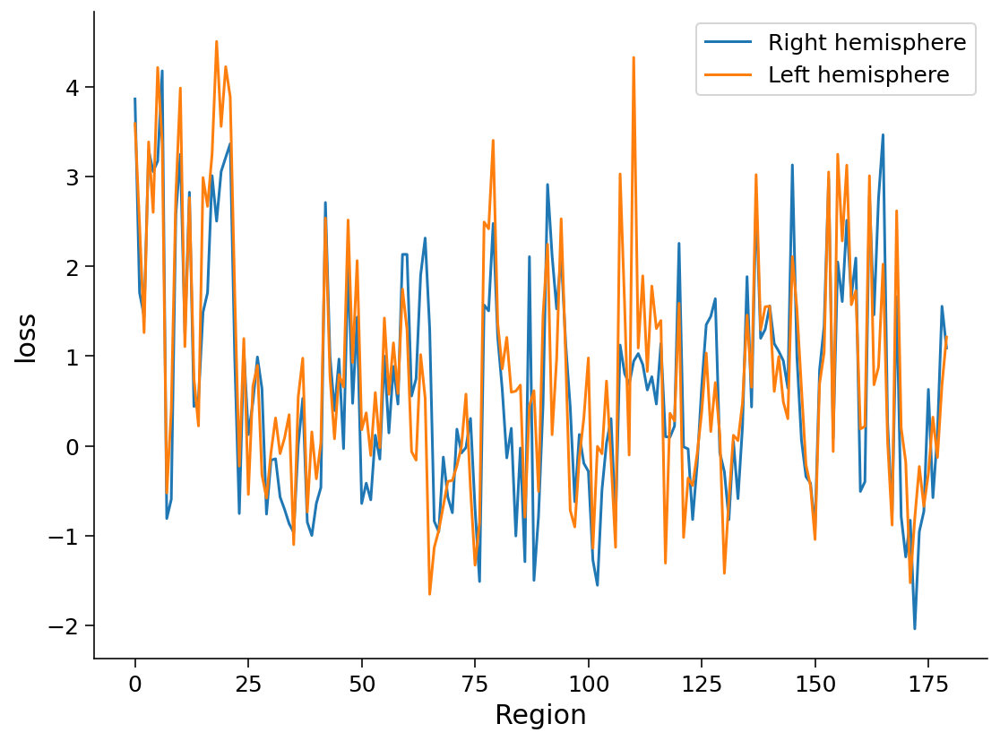

In [86]:
task = "gambling"
conditions = ["loss"]  # Run a substraction analysis between two conditions

loss_condition = []
for subject in subjects:

  # Get the average signal in each region for each condition
  evs = [load_evs(subject, task, cond) for cond in conditions]
  avgs = [selective_average(timeseries_task[subject], ev) for ev in evs]

  # Store the region-wise difference
  #contrast.append(avgs[0] - avgs[1])

loss_contrast = np.mean(avgs, axis=0)

hemi_contrasts = np.split(group_contrast, 2)

for i, hemi_contrast in enumerate(hemi_contrasts):
  plt.plot(hemi_contrast, label=f"{HEMIS[i]} hemisphere")

#plt.title("Win of %s - %s" % (conditions[0], conditions[1]))
plt.xlabel("Region")
plt.ylabel('loss')
plt.legend()
plt.show()

Plot group-averaged contrast value across regions:

Plot the regional values on the surface of one hemisphere:

In [87]:
fsaverage = datasets.fetch_surf_fsaverage()
surf_contrast = group_contrast[atlas["labels_L"]]

plotting.view_surf(fsaverage['infl_left'],
                            surf_contrast,
                            vmax=15)

In [88]:
atlas["labels_R"]

array([ 54, 116,  50, ..., 134, 134, 134], dtype=int32)

In [89]:
fsaverage = datasets.fetch_surf_fsaverage()
surf_contrast = group_contrast[ atlas["labels_R"] ]
plotting.view_surf(fsaverage['infl_right'],
                   surf_contrast,
                   vmax=15)

## Characterize values by functional network

Average the contrast values within parcels belonging to each network and plot:

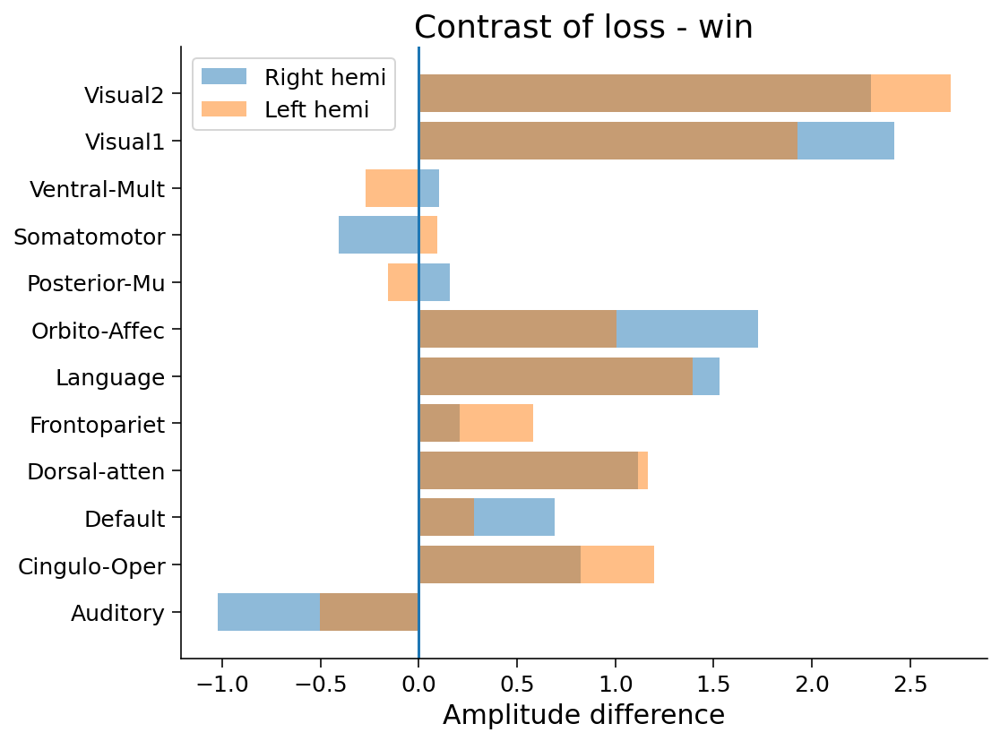

In [90]:
conditions = ["loss", "win"]
# Get unique network labels
network_names = np.unique(region_info["network"])

hemi_networks = np.split(region_info["network"], 2)
hemi_contrasts = np.split(group_contrast, 2)

# Get and plot mean contrast value per network, by hemisphere
for hemi, hemi_network, hemi_contrast in zip(HEMIS, hemi_networks, hemi_contrasts):
  network_vals = []
  for network in network_names:
    network_vals.append(hemi_contrast[hemi_network == network].mean())
  plt.barh(network_names, network_vals, alpha=.5, label=f"{hemi} hemi")

plt.axvline(0)
plt.xlabel("Amplitude difference")
plt.title(f"Contrast of {conditions[0]} - {conditions[1]}")
plt.legend()
plt.show()

# CSV Data for Gambling task


## Task performance measures

The dataset also includes aggregate behavior for each task run stored in task-specific `.csv` files. It is possible to load and work with these files using `numpy`:

In [91]:
gamb_df = pd.DataFrame( 
                            np.genfromtxt("hcp/behavior/gambling.csv",
                            delimiter=",",
                            names=True,
                            dtype=None,
                            encoding="utf") )
gamb_df
# median reaction time / 

,Subject,Run,ConditionName,MEDIAN_RT_LARGER,MEDIAN_RT_SMALLER,PROP_LARGER,PROP_NLR,PROP_SMALLER
0,0,0,PUNISH,577.0,348.0,0.6875,0.0,0.3125
1,0,0,REWARD,602.0,575.0,0.5625,0.0,0.4375
2,0,1,PUNISH,726.5,807.5,0.5000,0.0,0.5000
3,0,1,REWARD,638.0,640.5,0.5000,0.0,0.5000
4,1,0,PUNISH,217.0,232.0,0.3125,0.0,0.6875
...,...,...,...,...,...,...,...,...
1351,337,1,REWARD,617.0,669.0,0.4375,0.0,0.5625
1352,338,0,PUNISH,300.0,214.0,0.6875,0.0,0.3125
1353,338,0,REWARD,260.0,223.0,0.5625,0.0,0.4375
1354,338,1,PUNISH,318.0,227.0,0.3125,0.0,0.6875


In [92]:
gamb_df[ gamb_df['ConditionName']=='PUNISH']

,Subject,Run,ConditionName,MEDIAN_RT_LARGER,MEDIAN_RT_SMALLER,PROP_LARGER,PROP_NLR,PROP_SMALLER
0,0,0,PUNISH,577.0,348.0,0.6875,0.0,0.3125
2,0,1,PUNISH,726.5,807.5,0.5000,0.0,0.5000
4,1,0,PUNISH,217.0,232.0,0.3125,0.0,0.6875
6,1,1,PUNISH,226.0,215.0,0.6875,0.0,0.3125
8,2,0,PUNISH,392.0,475.0,0.5625,0.0,0.4375
...,...,...,...,...,...,...,...,...
1346,336,1,PUNISH,391.0,346.5,0.6250,0.0,0.3750
1348,337,0,PUNISH,563.0,490.0,0.4375,0.0,0.5625
1350,337,1,PUNISH,717.0,680.0,0.6875,0.0,0.3125
1352,338,0,PUNISH,300.0,214.0,0.6875,0.0,0.3125


In [93]:
gamb_df[ gamb_df['ConditionName']=='REWARD']

,Subject,Run,ConditionName,MEDIAN_RT_LARGER,MEDIAN_RT_SMALLER,PROP_LARGER,PROP_NLR,PROP_SMALLER
1,0,0,REWARD,602.0,575.0,0.562500,0.0,0.437500
3,0,1,REWARD,638.0,640.5,0.500000,0.0,0.500000
5,1,0,REWARD,259.0,262.0,0.687500,0.0,0.312500
7,1,1,REWARD,246.0,314.5,0.333333,0.0,0.666667
9,2,0,REWARD,413.0,395.0,0.437500,0.0,0.562500
...,...,...,...,...,...,...,...,...
1347,336,1,REWARD,402.5,440.0,0.125000,0.0,0.875000
1349,337,0,REWARD,553.5,600.5,0.750000,0.0,0.250000
1351,337,1,REWARD,617.0,669.0,0.437500,0.0,0.562500
1353,338,0,REWARD,260.0,223.0,0.562500,0.0,0.437500


In [94]:
gamb_df.describe()

,Subject,Run,MEDIAN_RT_LARGER,MEDIAN_RT_SMALLER,PROP_LARGER,PROP_NLR,PROP_SMALLER
count,1356.000000,1356.000000,1315.000000,1332.000000,1356.000000,1356.0,1356.000000
mean,169.000000,0.500000,401.462357,406.146396,0.498218,0.0,0.501782
std,97.896549,0.500184,132.040533,127.526021,0.180177,0.0,0.180177
min,0.000000,0.000000,189.500000,165.000000,0.000000,0.0,0.000000
25%,84.000000,0.000000,301.000000,308.750000,0.437500,0.0,0.400000
50%,169.000000,0.500000,375.000000,384.750000,0.500000,0.0,0.500000
75%,254.000000,1.000000,480.500000,487.625000,0.600000,0.0,0.562500
max,338.000000,1.000000,1060.000000,990.000000,1.000000,0.0,1.000000


In [95]:
gamb_df.dropna( inplace=True)#.isna().sum()

In [96]:
gamb_df

,Subject,Run,ConditionName,MEDIAN_RT_LARGER,MEDIAN_RT_SMALLER,PROP_LARGER,PROP_NLR,PROP_SMALLER
0,0,0,PUNISH,577.0,348.0,0.6875,0.0,0.3125
1,0,0,REWARD,602.0,575.0,0.5625,0.0,0.4375
2,0,1,PUNISH,726.5,807.5,0.5000,0.0,0.5000
3,0,1,REWARD,638.0,640.5,0.5000,0.0,0.5000
4,1,0,PUNISH,217.0,232.0,0.3125,0.0,0.6875
...,...,...,...,...,...,...,...,...
1351,337,1,REWARD,617.0,669.0,0.4375,0.0,0.5625
1352,338,0,PUNISH,300.0,214.0,0.6875,0.0,0.3125
1353,338,0,REWARD,260.0,223.0,0.5625,0.0,0.4375
1354,338,1,PUNISH,318.0,227.0,0.3125,0.0,0.6875


In [97]:
gamb_df.isna().sum()

Subject              0
Run                  0
ConditionName        0
MEDIAN_RT_LARGER     0
MEDIAN_RT_SMALLER    0
PROP_LARGER          0
PROP_NLR             0
PROP_SMALLER         0
dtype: int64

In [98]:
y= gamb_df['ConditionName']
x=gamb_df.drop(columns=['ConditionName','PROP_NLR'])

In [99]:
x

,Subject,Run,MEDIAN_RT_LARGER,MEDIAN_RT_SMALLER,PROP_LARGER,PROP_SMALLER
0,0,0,577.0,348.0,0.6875,0.3125
1,0,0,602.0,575.0,0.5625,0.4375
2,0,1,726.5,807.5,0.5000,0.5000
3,0,1,638.0,640.5,0.5000,0.5000
4,1,0,217.0,232.0,0.3125,0.6875
...,...,...,...,...,...,...
1351,337,1,617.0,669.0,0.4375,0.5625
1352,338,0,300.0,214.0,0.6875,0.3125
1353,338,0,260.0,223.0,0.5625,0.4375
1354,338,1,318.0,227.0,0.3125,0.6875


In [100]:
len(y)==len(x)

True

In [101]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

In [102]:
x_train , x_test , y_train , y_test = train_test_split( x , y)
rf= RandomForestClassifier()
rf.fit(x_train , y_train)


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [103]:
rf.score(x_test,y_test)

0.44272445820433437

But, while not formally taught as part of the course, [`pandas`](https://pandas.pydata.org/) offers more powerful tools for tabular data analysis.

## Pseudo-demographics

The NMA-distributed version of the HCP data does not contain any real demographic information. But we have created a synthetic dataset of 25 "demographic" variables based on a model trained on the original dataset to predict demographics from resting-state network organization measures:

In [104]:
demo = np.load("hcp/pseudo_demographics.npy")
pd.DataFrame( demo )

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
0,0.392941,0.057692,-0.365413,-1.242339,0.886487,-0.118113,-1.358017,-0.874159,1.454448,0.460180,-0.650883,-1.064195,-1.862511,-0.161437,-1.414792,0.969070,-0.658313,-1.004386,0.592319,-0.418473,-0.744508,-0.030953,-0.624850,0.166761,-0.630867
1,-0.162761,0.924272,1.399392,0.491701,-1.628535,0.796503,1.897533,0.686868,0.216466,1.149455,-0.373347,-0.442922,-1.695049,-2.020684,-0.441554,0.478915,-1.038934,0.042644,-0.381007,-1.768690,0.663769,-0.476182,0.082766,-1.102389,-2.318249
2,0.964455,-0.002066,0.645799,-0.731741,-1.107864,0.580686,0.552066,0.850594,-1.200263,-1.827447,0.670346,-0.415654,0.130702,0.587298,-1.543339,0.217485,0.627338,2.367991,0.877149,-0.151062,-0.761572,-1.123273,1.399336,1.851779,1.606615
3,-0.712342,-2.253563,1.461665,0.423563,1.384665,-0.956029,-1.509536,0.523032,-1.461323,1.968053,1.251547,-0.419200,0.728507,0.395727,0.927169,1.022447,-0.846809,-0.154073,-2.694589,0.708312,-0.499991,2.006338,0.909832,0.092488,0.495792
4,-0.260158,-1.451241,0.621722,2.167208,-2.313580,1.547050,0.231169,1.439638,1.079252,0.380347,1.299224,-0.017349,2.061890,0.188685,0.948989,-0.936707,0.438914,-0.521452,-0.115057,0.984377,-0.289264,1.313247,0.791525,-0.582974,0.688333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
334,0.618304,-0.169080,-2.030099,-0.605227,-1.058259,-0.333048,-1.300023,1.030396,0.274440,0.138367,-0.825755,-0.206627,-1.143696,1.980262,-0.847632,-0.561873,0.165704,1.211354,0.361853,-0.144159,-0.914940,-0.493249,-0.369134,0.244138,-0.704886
335,-1.991894,-0.485520,-0.577195,-0.752406,0.740905,-0.309513,0.176704,0.084772,-0.579391,2.028873,-0.284023,-0.773056,0.540121,-0.623564,-2.181916,-1.304061,0.045949,-0.804549,-0.081666,1.003815,0.294892,0.464749,1.433391,0.223819,0.685604
336,1.475698,-0.627730,1.185665,-1.583718,-0.348085,0.677284,-0.182399,-1.805187,-1.533939,-1.769166,-0.651295,-1.072342,-1.195790,0.186168,0.977794,0.149378,-0.281788,1.297334,0.548276,-0.107903,0.303734,-1.422839,-0.852304,-0.658506,0.009578
337,0.093330,0.069225,-0.373106,-0.516747,0.219108,0.743134,0.268361,-0.433366,-0.422993,-0.499629,-0.087591,-3.143855,-0.318148,1.005446,0.580611,-2.435196,-1.266124,1.376986,0.427862,1.160707,0.326214,-1.234347,1.350649,-0.985437,-0.018873


## Original subject IDs

The dataset also contains a key to map the ordinal subject numbers to the IDs used in the original HCP dataset:

In [105]:
ids = np.loadtxt("hcp/orig_ids.txt")
print(ids[:8])
pd.DataFrame( ids)

[199453. 580751. 173435. 919966. 181636. 192843. 894067. 174437.]


,0
0,199453.0
1,580751.0
2,173435.0
3,919966.0
4,181636.0
...,...
334,147030.0
335,210415.0
336,139637.0
337,134425.0
